<a href="https://colab.research.google.com/github/thunderhoser/cira_ml_short_course/blob/master/lecture03_notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Lecture 3: Decision trees, forests, and clustering

This notebook was used for the CIRA (Cooperative Institute for Research in the Atmosphere) machine-learning short course in Fall 2020.

If you use code from this notebook, please cite it as follows.

Lagerquist, Ryan, and David John Gagne II, 2020: "Lecture 3: Decision trees, forests, and clustering". CIRA (Cooperative Institute for Research in the Atmosphere) machine-learning short course, https://github.com/thunderhoser/cira_ml_short_course/.

# References

This notebook refers to a few publications, listed below.  Schwartz *et al.* (2015) documents the dataset used.

Chisholm, D., J. Ball, K. Veigas, and P. Luty, 1968: "The diagnosis of upper-level humidity." *Journal of Applied Meteorology*, **7 (4)**, 613-619, https://doi.org/10.1175/1520-0450(1968)007%3C0613:TDOULH%3E2.0.CO;2.

McGovern, A., D. Gagne II, J. Basara, T. Hamill, and D. Margolin, 2015: "Solar energy prediction: An international contest to initiate interdisciplinary research on compelling meteorological problems." *Bulletin of the American Meteorological Society*, **96 (8)**, 1388-1395, https://doi.org/10.1175/BAMS-D-14-00006.1.

Quinlan, J., 1986: "Induction of decision trees." *Machine Learning*, **1 (1)**, 81–106, https://doi.org/10.1007/BF00116251.

Schwartz, C., G. Romine, M. Weisman, R. Sobash, K. Fossell, K. Manning, and S. Trier, 2015: "A real-time convection-allowing ensemble prediction system initialized by mesoscale ensemble Kalman filter analyses." *Weather and Forecasting*, **30 (5)**, 1158-1181, https://doi.org/10.1175/WAF-D-15-0013.1.

# <font color='red'>Clone the Git repository (required)</font>

- **Please note**: when a section title is in <font color='red'>red</font>, that means the code cell below is required.
- In other words, if you don't run the code cell below, subsequent code cells might not work.

In [ ]:
import os
import shutil

if os.path.isdir('course_repository'):
    shutil.rmtree('course_repository')

!git clone https://github.com/thunderhoser/cira_ml_short_course course_repository
!cd course_repository; python setup.py install

!pip uninstall -y descartes
!pip install descartes
!pip uninstall -y shapely
!pip install shapely==1.8.5

Cloning into 'course_repository'...
remote: Enumerating objects: 45, done.
remote: Counting objects: 100% (45/45), done.
remote: Compressing objects: 100% (37/37), done.
remote: Total 401 (delta 17), reused 34 (delta 8), pack-reused 356
Receiving objects: 100% (401/401), 104.26 MiB | 16.24 MiB/s, done.
Resolving deltas: 100% (227/227), done.
running install
running bdist_egg
running egg_info
creating cira_ml_short_course.egg-info
writing cira_ml_short_course.egg-info/PKG-INFO
writing dependency_links to cira_ml_short_course.egg-info/dependency_links.txt
writing requirements to cira_ml_short_course.egg-info/requires.txt
writing top-level names to cira_ml_short_course.egg-info/top_level.txt
writing manifest file 'cira_ml_short_course.egg-info/SOURCES.txt'
writing manifest file 'cira_ml_short_course.egg-info/SOURCES.txt'
installing library code to build/bdist.linux-x86_64/egg
running install_lib
running build_py
creating build
creating build/lib
creating build/lib/cira_ml_short_course
cop

# <font color='red'>Import packages (required)</font>

The next two cells import all packages used in the notebook.

In [ ]:
import sys

sys.path.append('/content/data/')
sys.path.append('/content/course_repository/')
sys.path.append('/content/course_repository/cira_ml_short_course/')
sys.path.append('/content/course_repository/cira_ml_short_course/utils/')

In [ ]:
%matplotlib inline
import copy
import os.path
import warnings
import numpy
import keras
from matplotlib import pyplot
from cira_ml_short_course.utils import utils

warnings.filterwarnings('ignore')

SEPARATOR_STRING = '\n\n' + '*' * 50 + '\n\n'
MINOR_SEPARATOR_STRING = '\n\n' + '-' * 50 + '\n\n'

DATA_DIRECTORY_NAME = '/content/data/track_data_ncar_ams_3km_csv_small'

# <font color='red'>Prevent auto-scrolling (required)</font>

In [ ]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

# <font color='red'>Download input data (required)</font>

The next cell downloads all input data used in this notebook.

In [ ]:
!python /content/course_repository/download_tabular_data.py

Unzipping file: "data/track_data_ncar_ams_3km_csv_small.tar.gz"...


# <font color='red'>Read input data (required)</font>

The next cell reads all input data for this notebook into memory.

In [ ]:
training_file_names = utils.find_tabular_files(
    directory_name=DATA_DIRECTORY_NAME, first_date_string='20100101',
    last_date_string='20141231'
)
validation_file_names = utils.find_tabular_files(
    directory_name=DATA_DIRECTORY_NAME, first_date_string='20150101',
    last_date_string='20151231'
)
testing_file_names = utils.find_tabular_files(
    directory_name=DATA_DIRECTORY_NAME, first_date_string='20160101',
    last_date_string='20171231'
)

(training_metadata_table, training_predictor_table_denorm,
 training_target_table
) = utils.read_many_tabular_files(training_file_names)
print(MINOR_SEPARATOR_STRING)

(validation_metadata_table, validation_predictor_table_denorm,
 validation_target_table
) = utils.read_many_tabular_files(validation_file_names)
print(MINOR_SEPARATOR_STRING)

(testing_metadata_table, testing_predictor_table_denorm,
 testing_target_table
) = utils.read_many_tabular_files(testing_file_names)
print(MINOR_SEPARATOR_STRING)

print('Variables in metadata are as follows:\n{0:s}'.format(
    str(list(training_metadata_table))
))

print('\nPredictor variables are as follows:\n{0:s}'.format(
    str(list(training_predictor_table_denorm))
))

print('\nTarget variable is as follows:\n{0:s}'.format(
    str(list(training_target_table))
))

first_predictor_name = list(training_predictor_table_denorm)[0]
these_predictor_values = (
    training_predictor_table_denorm[first_predictor_name].values[:10]
)

message_string = (
    '\nValues of predictor variable "{0:s}" for the first training '
    'examples:\n{1:s}'
).format(first_predictor_name, str(these_predictor_values))
print(message_string)

target_name = list(training_target_table)[0]
these_target_values = training_target_table[target_name].values[:10]

message_string = (
    '\nValues of target variable for the first training examples:\n{0:s}'
).format(str(these_target_values))
print(message_string)

Reading data from: "/content/data/track_data_ncar_ams_3km_csv_small/track_step_NCARSTORM_d01_20101024-0000.csv"...
Reading data from: "/content/data/track_data_ncar_ams_3km_csv_small/track_step_NCARSTORM_d01_20101122-0000.csv"...
Reading data from: "/content/data/track_data_ncar_ams_3km_csv_small/track_step_NCARSTORM_d01_20110201-0000.csv"...
Reading data from: "/content/data/track_data_ncar_ams_3km_csv_small/track_step_NCARSTORM_d01_20110308-0000.csv"...
Reading data from: "/content/data/track_data_ncar_ams_3km_csv_small/track_step_NCARSTORM_d01_20110326-0000.csv"...
Reading data from: "/content/data/track_data_ncar_ams_3km_csv_small/track_step_NCARSTORM_d01_20110404-0000.csv"...
Reading data from: "/content/data/track_data_ncar_ams_3km_csv_small/track_step_NCARSTORM_d01_20110414-0000.csv"...
Reading data from: "/content/data/track_data_ncar_ams_3km_csv_small/track_step_NCARSTORM_d01_20110420-0000.csv"...
Reading data from: "/content/data/track_data_ncar_ams_3km_csv_small/track_step_N

# <font color='red'>Normalization (required)</font>

- The next cell normalizes predictor variables in all three datasets (training, validation, and testing).
- Recall from Lecture 2 that the normalization parameters used (mean and standard deviation for each predictor variable) are computed from the training data only.
- This ensures that information from the validation and testing data have not "leaked" into the training data.

In [ ]:
predictor_names = list(training_predictor_table_denorm)
these_predictor_values = (
    training_predictor_table_denorm[predictor_names[0]].values[:10]
)

message_string = (
    'Original values of "{0:s}" for the first training examples:\n{1:s}'
).format(predictor_names[0], str(these_predictor_values))
print(message_string)

training_predictor_table, normalization_dict = utils.normalize_predictors(
    predictor_table=copy.deepcopy(training_predictor_table_denorm)
)

these_predictor_values = (
    training_predictor_table[predictor_names[0]].values[:10]
)

message_string = (
    '\nNormalized values of "{0:s}" for the first training examples:\n{1:s}'
).format(predictor_names[0], str(these_predictor_values))
print(message_string)

training_predictor_table_denorm = utils.denormalize_predictors(
    predictor_table=copy.deepcopy(training_predictor_table),
    normalization_dict=normalization_dict
)

these_predictor_values = (
    training_predictor_table_denorm[predictor_names[0]].values[:10]
)

message_string = (
    '\n*De*normalized values (should equal original values) of "{0:s}" for '
    'the first training examples:\n{1:s}'
).format(predictor_names[0], str(these_predictor_values))
print(message_string)

validation_predictor_table, _ = utils.normalize_predictors(
    predictor_table=copy.deepcopy(validation_predictor_table_denorm),
    normalization_dict=normalization_dict
)

testing_predictor_table, _ = utils.normalize_predictors(
    predictor_table=copy.deepcopy(testing_predictor_table_denorm),
    normalization_dict=normalization_dict
)

Original values of "composite_refl_mean_dbz" for the first training examples:
[42.71822 47.09285 45.53852 44.30976 44.64383 44.33831 45.73259 43.69113
 45.3804  47.31104]

Normalized values of "composite_refl_mean_dbz" for the first training examples:
[-1.03619508  0.06182963 -0.32830456 -0.63672124 -0.55287024 -0.62955524
 -0.27959332 -0.79199632 -0.36799241  0.11659495]

*De*normalized values (should equal original values) of "composite_refl_mean_dbz" for the first training examples:
[42.71822 47.09285 45.53852 44.30976 44.64383 44.33831 45.73259 43.69113
 45.3804  47.31104]


# <font color='red'>Binarization (required)</font>

- The next cell binarizes the target variable (max future vorticity in s$^{-1}$).
- Binarization turns each value into a 0 (no) or 1 (yes), based on whether or not future vorticity reaches a threshold.
- Thus, **all ML models in this notebook perform classification rather than regression.**
<br><br>
- **However, all ML models in this notebook can also perform regression.**  The main difference is that, for decision trees and ensembles thereof (random and gradient-boosted forests), the loss function for classification is different
- Specifically, the loss function for classification is typically Gini or entropy, whereas the loss function for regression is typically MSE.

In [ ]:
binarization_threshold = utils.get_binarization_threshold(
    tabular_file_names=training_file_names, percentile_level=90.
)
print(MINOR_SEPARATOR_STRING)

these_target_values = (
    training_target_table[utils.TARGET_NAME].values[1030:1050]
)

message_string = (
    'Real-numbered target values for a few training examples:\n{0:s}'
).format(str(these_target_values))
print(message_string)

training_target_values = utils.binarize_target_values(
    target_values=training_target_table[utils.TARGET_NAME].values,
    binarization_threshold=binarization_threshold
)
training_target_table = training_target_table.assign(
    **{utils.BINARIZED_TARGET_NAME: training_target_values}
)

print('\nBinarization threshold = {0:.3e} s^-1'.format(
    binarization_threshold
))

these_target_values = (
    training_target_table[utils.BINARIZED_TARGET_NAME].values[1030:1050]
)

message_string = (
    '\nBinarized target values for the same training examples:\n{0:s}'
).format(str(these_target_values))
print(message_string)

validation_target_values = utils.binarize_target_values(
    target_values=validation_target_table[utils.TARGET_NAME].values,
    binarization_threshold=binarization_threshold
)
validation_target_table = validation_target_table.assign(
    **{utils.BINARIZED_TARGET_NAME: validation_target_values}
)

testing_target_values = utils.binarize_target_values(
    target_values=testing_target_table[utils.TARGET_NAME].values,
    binarization_threshold=binarization_threshold
)
testing_target_table = testing_target_table.assign(
    **{utils.BINARIZED_TARGET_NAME: testing_target_values}
)

Reading data from: "/content/data/track_data_ncar_ams_3km_csv_small/track_step_NCARSTORM_d01_20101024-0000.csv"...
Reading data from: "/content/data/track_data_ncar_ams_3km_csv_small/track_step_NCARSTORM_d01_20101122-0000.csv"...
Reading data from: "/content/data/track_data_ncar_ams_3km_csv_small/track_step_NCARSTORM_d01_20110201-0000.csv"...
Reading data from: "/content/data/track_data_ncar_ams_3km_csv_small/track_step_NCARSTORM_d01_20110308-0000.csv"...
Reading data from: "/content/data/track_data_ncar_ams_3km_csv_small/track_step_NCARSTORM_d01_20110326-0000.csv"...
Reading data from: "/content/data/track_data_ncar_ams_3km_csv_small/track_step_NCARSTORM_d01_20110404-0000.csv"...
Reading data from: "/content/data/track_data_ncar_ams_3km_csv_small/track_step_NCARSTORM_d01_20110414-0000.csv"...
Reading data from: "/content/data/track_data_ncar_ams_3km_csv_small/track_step_NCARSTORM_d01_20110420-0000.csv"...
Reading data from: "/content/data/track_data_ncar_ams_3km_csv_small/track_step_N

# Decision trees

## Theory

- A decision tree is a flow chart with **branch nodes** (ellipses) and **leaf nodes** (rectangles).  In the figure below, $f$ is the forecast probability of severe weather.

<center><img src="https://raw.githubusercontent.com/thunderhoser/cira_ml_short_course/master/tree_schematic.jpg" alt="Decision-tree schematic" width="750" /></center>

 - The branch nodes are bifurcating, and the leaf nodes are terminal.
 - In other words, each branch node has 2 children and each leaf node has 0 children.
 - **Predictions are made at the leaf nodes, and questions are asked at the branch nodes.**
 - Since the branch nodes are bifurcating, **questions asked at the branch nodes must be yes-or-no.**
<br><br>
 - Decision trees have been used in meteorology since the 1960s (Chisholm 1968).
 - They were built subjectively by human experts until the 1980s, when an objective algorithm (Quinlan 1986) was developed to "train" them (determine the best question at each branch node).
<br><br>
 - **The prediction at leaf node $L$ is the average of all training examples that reached $L$.**
 - For regression this is a real value (average max future vorticity of examples that reached $L$).
 - For classification this is a probability (fraction of examples that reached $L$ with max future vorticity $\ge 3.850 \times 10^{-3}\textrm{ s}^{-1}$).
<br><br>
 - **The question chosen at each branch node is that which maximizes information gain (see lecture notes for math).**

## Training and evaluation

The next cell trains a default decision tree (*i.e.*, one with default hyperparameters) to forecast the probability that a storm will develop strong rotation (vorticity $\ge 3.850 \times 10^{-3}\textrm{ s}^{-1}$) in the future.

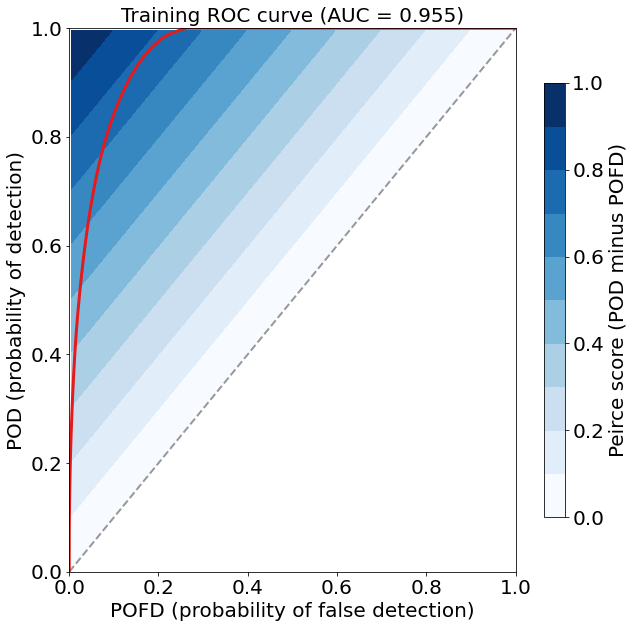

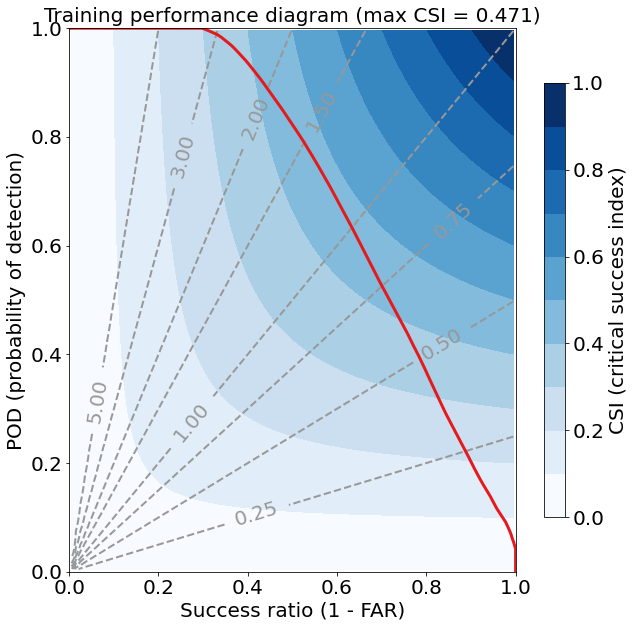

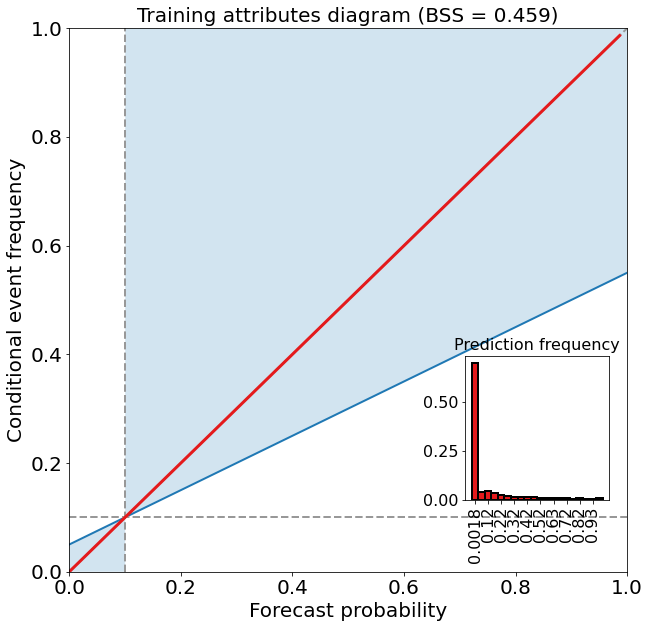

Training max Peirce score (POD - POFD) = 0.781
Training AUC (area under ROC curve) = 0.955
Training max CSI (critical success index) = 0.471
Training Brier score = 0.049
Training Brier skill score (improvement over climatology) = 0.459


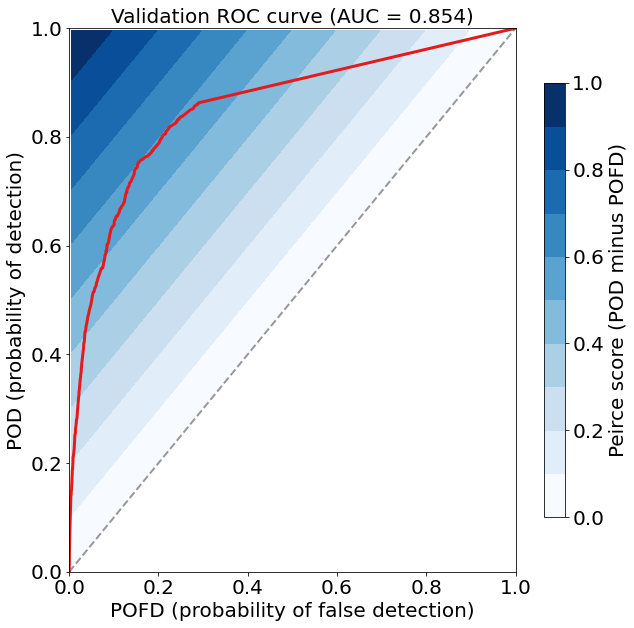

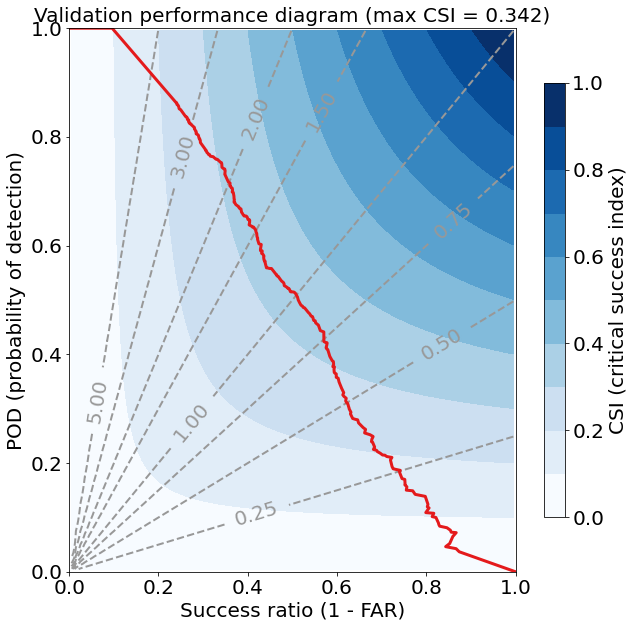

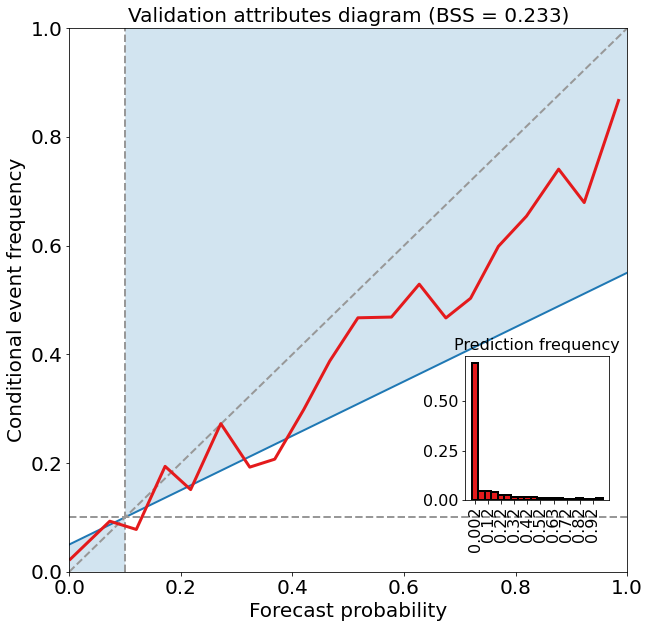

Validation max Peirce score (POD - POFD) = 0.598
Validation AUC (area under ROC curve) = 0.854
Validation max CSI (critical success index) = 0.342
Validation Brier score = 0.069
Validation Brier skill score (improvement over climatology) = 0.233


In [ ]:
default_tree_model_object = utils.setup_classification_tree(
    min_examples_at_split=2000, min_examples_at_leaf=30
)

_ = utils.train_classification_tree(
    model_object=default_tree_model_object,
    training_predictor_table=training_predictor_table,
    training_target_table=training_target_table
)

training_probabilities = default_tree_model_object.predict_proba(
    training_predictor_table.to_numpy()
)[:, 1]
training_event_frequency = numpy.mean(
    training_target_table[utils.BINARIZED_TARGET_NAME].values
)

_ = utils.eval_binary_classifn(
    observed_labels=
    training_target_table[utils.BINARIZED_TARGET_NAME].values,
    forecast_probabilities=training_probabilities,
    training_event_frequency=training_event_frequency,
    dataset_name='training'
)

validation_probabilities = default_tree_model_object.predict_proba(
    validation_predictor_table.to_numpy()
)[:, 1]

_ = utils.eval_binary_classifn(
    observed_labels=
    validation_target_table[utils.BINARIZED_TARGET_NAME].values,
    forecast_probabilities=validation_probabilities,
    training_event_frequency=training_event_frequency,
    dataset_name='validation'
)

## Plot tree

- **The next cell plots the decision tree we just trained.**
- The tree is many levels deep, so for the sake of simplicity, we plot only the top few levels.
- The following numbers are shown inside each split node:
<br><br>

`predictor <= threshold` (the two learned parameters for each split node)
<br>
`num_examples`
<br>
`[num_negative_examples, num_positive_examples]`
<br><br>

- `num_examples` is the number of training examples that reach the given node.
- `num_negative_examples` is the number of such examples that are negative (without strong future rotation).
- `num_positive_examples` is the number of such examples that are positive (with strong future rotation).
- Note that `num_examples = num_negative_examples + num_positive_examples` always.

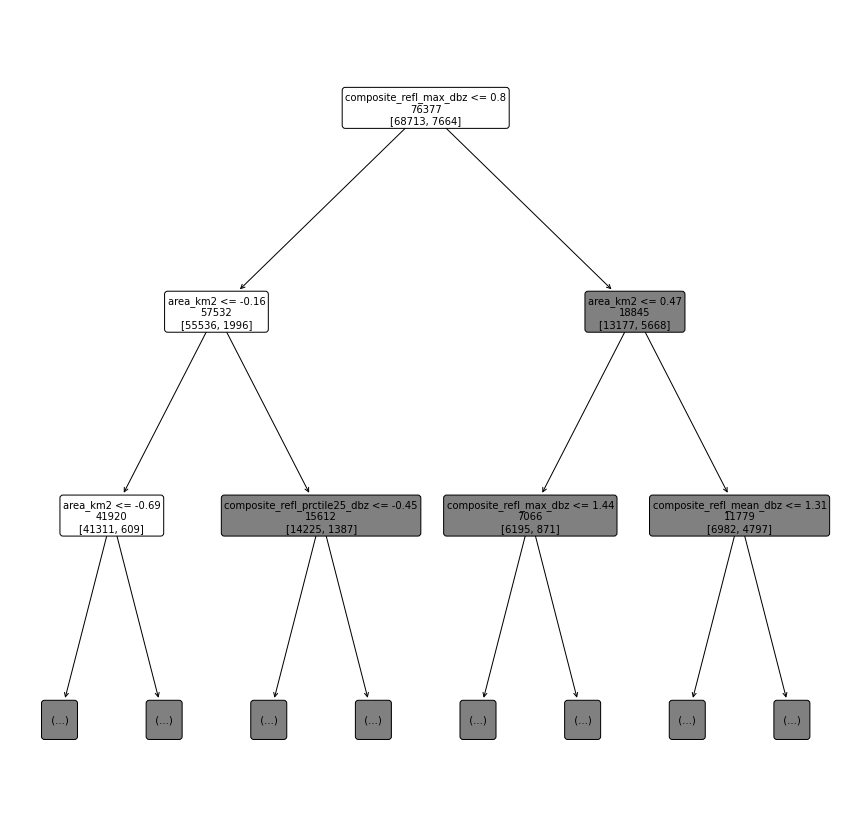

In [ ]:
utils.plot_decision_tree(
    model_object=default_tree_model_object,
    predictor_names=list(training_predictor_table),
    num_levels_to_show=3, font_size=10
)

# Tuning decision-tree hyperparameters

 - **Two hyperparameters (among others) control the depth of a decision tree:** minimum examples per branch node ($N_b^{\textrm{min}}$) and per leaf node ($N_l^{\textrm{min}}$).
 - If these values are set to 1, the tree can become very deep, which increases its ability to overfit.
 - You can think of this another way: if there is one example at each leaf node, all predictions will be based on only one example and will probably not generalize well to new data.
<br><br>
 - Conversely, if $N_b^{\textrm{min}}$ and $N_l^{\textrm{min}}$ are set too high, the tree will not become deep enough, causing it to underfit.
 - For example, suppose that you have 1000 training examples and set $N_l^{\textrm{min}}$ to 1000.
 - This will allow only one branch node (the root node); both children of the root node will have $<$ 1000 examples.
 - Thus, predictions will be based on only one question.
<br><br>

**Recall the four steps of any hyperparameter experiment:**

 1. Choose the values to be attempted.  We will try $N_b^{\textrm{min}} \in \lbrace 2, 5, 10, 20, 30, 40, 50, 100, 200, 500 \rbrace$ and $N_l^{\textrm{min}} \in \lbrace 1, 5, 10, 20, 30, 40, 50, 100, 200, 500 \rbrace$.  However, we will not try combinations where $N_l^{\textrm{min}} \ge N_b^{\textrm{min}}$, because this makes no sense (the child of a node with $N$ examples cannot have $\ge N$ examples).
 2. Train a model with each combination.
 3. Evaluate each model on the validation data.
 4. Select the model that performs best on validation data.  Here we will define "best" as that with the highest Brier skill score.

## Training

The next cell performs steps 1 and 2 of the hyperparameter experiment (defining the values to be attempted and training the models).

In [ ]:
min_per_split_values = numpy.array(
    [2, 5, 10, 20, 30, 40, 50, 100, 200, 500], dtype=int
)
min_per_leaf_values = numpy.array(
    [1, 5, 10, 20, 30, 40, 50, 100, 200, 500], dtype=int
)

num_min_per_split_values = len(min_per_split_values)
num_min_per_leaf_values = len(min_per_leaf_values)

validation_auc_matrix = numpy.full(
    (num_min_per_split_values, num_min_per_leaf_values), numpy.nan
)

validation_max_csi_matrix = validation_auc_matrix + 0.
validation_bs_matrix = validation_auc_matrix + 0.
validation_bss_matrix = validation_auc_matrix + 0.

training_event_frequency = numpy.mean(
    training_target_table[utils.BINARIZED_TARGET_NAME].values
)

for i in range(num_min_per_split_values):
    for j in range(num_min_per_leaf_values):
        if min_per_leaf_values[j] >= min_per_split_values[i]:
            continue

        this_message_string = (
            'Training model with minima of {0:d} examples per split node, '
            '{1:d} per leaf node...'
        ).format(min_per_split_values[i], min_per_leaf_values[j])

        print(this_message_string)

        this_model_object = utils.setup_classification_tree(
            min_examples_at_split=min_per_split_values[i],
            min_examples_at_leaf=min_per_leaf_values[j]
        )

        _ = utils.train_classification_tree(
            model_object=this_model_object,
            training_predictor_table=training_predictor_table,
            training_target_table=training_target_table
        )

        these_validation_predictions = this_model_object.predict_proba(
            validation_predictor_table.to_numpy()
        )[:, 1]

        this_evaluation_dict = utils.eval_binary_classifn(
            observed_labels=
            validation_target_table[utils.BINARIZED_TARGET_NAME].values,
            forecast_probabilities=these_validation_predictions,
            training_event_frequency=training_event_frequency,
            create_plots=False, verbose=False
        )

        validation_auc_matrix[i, j] = this_evaluation_dict[utils.AUC_KEY]
        validation_max_csi_matrix[i, j] = (
            this_evaluation_dict[utils.MAX_CSI_KEY]
        )
        validation_bs_matrix[i, j] = (
            this_evaluation_dict[utils.BRIER_SCORE_KEY]
        )
        validation_bss_matrix[i, j] = (
            this_evaluation_dict[utils.BRIER_SKILL_SCORE_KEY]
        )

Training model with minima of 2 examples per split node, 1 per leaf node...
Training model with minima of 5 examples per split node, 1 per leaf node...
Training model with minima of 10 examples per split node, 1 per leaf node...
Training model with minima of 10 examples per split node, 5 per leaf node...
Training model with minima of 20 examples per split node, 1 per leaf node...
Training model with minima of 20 examples per split node, 5 per leaf node...
Training model with minima of 20 examples per split node, 10 per leaf node...
Training model with minima of 30 examples per split node, 1 per leaf node...
Training model with minima of 30 examples per split node, 5 per leaf node...
Training model with minima of 30 examples per split node, 10 per leaf node...
Training model with minima of 30 examples per split node, 20 per leaf node...
Training model with minima of 40 examples per split node, 1 per leaf node...
Training model with minima of 40 examples per split node, 5 per leaf node..

## Validation

The next cell performs step 3 of the hyperparameter experiment (evaluates each model on the validation data).

Text(0.5, 1.0, 'Brier skill score on validation data')

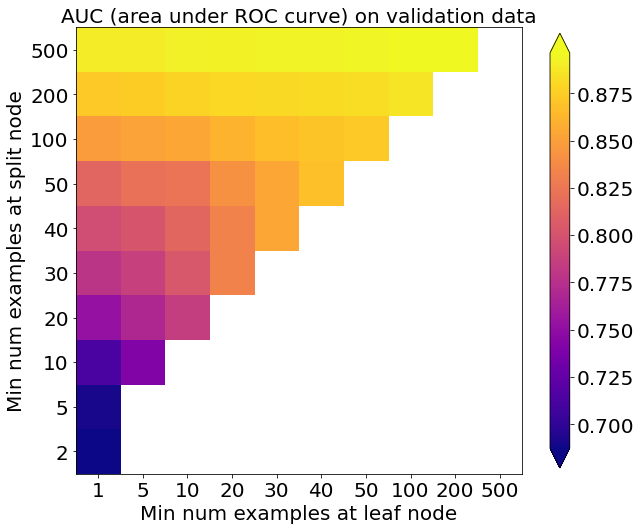

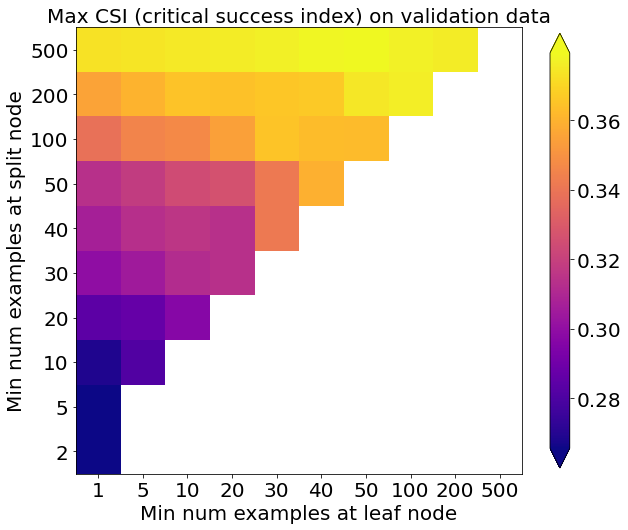

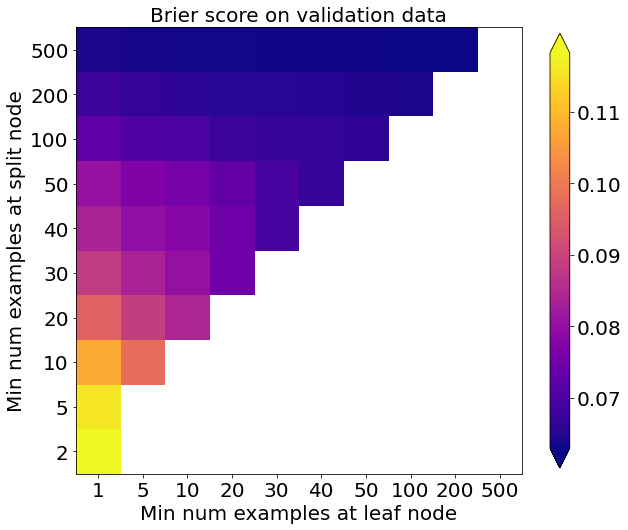

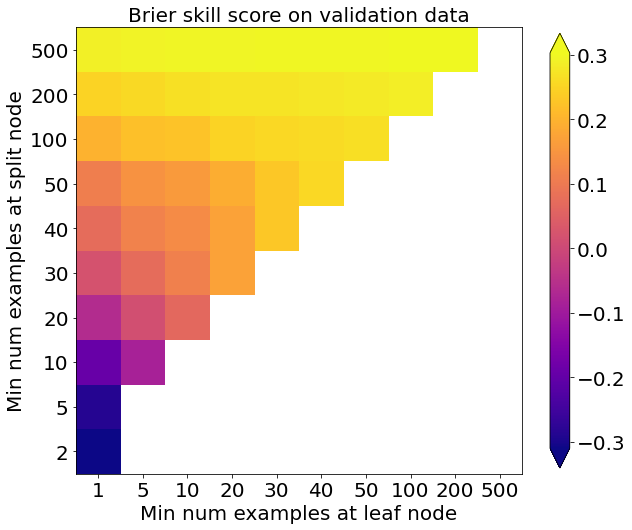

In [ ]:
utils.plot_scores_2d(
    score_matrix=validation_auc_matrix,
    min_colour_value=numpy.nanpercentile(validation_auc_matrix, 1.),
    max_colour_value=numpy.nanpercentile(validation_auc_matrix, 99.),
    x_tick_labels=min_per_leaf_values,
    y_tick_labels=min_per_split_values
)

pyplot.xlabel('Min num examples at leaf node')
pyplot.ylabel('Min num examples at split node')
pyplot.title('AUC (area under ROC curve) on validation data')

utils.plot_scores_2d(
    score_matrix=validation_max_csi_matrix,
    min_colour_value=numpy.nanpercentile(validation_max_csi_matrix, 1.),
    max_colour_value=numpy.nanpercentile(validation_max_csi_matrix, 99.),
    x_tick_labels=min_per_leaf_values,
    y_tick_labels=min_per_split_values
)

pyplot.xlabel('Min num examples at leaf node')
pyplot.ylabel('Min num examples at split node')
pyplot.title('Max CSI (critical success index) on validation data')

utils.plot_scores_2d(
    score_matrix=validation_bs_matrix,
    min_colour_value=numpy.nanpercentile(validation_bs_matrix, 1.),
    max_colour_value=numpy.nanpercentile(validation_bs_matrix, 99.),
    x_tick_labels=min_per_leaf_values,
    y_tick_labels=min_per_split_values
)

pyplot.xlabel('Min num examples at leaf node')
pyplot.ylabel('Min num examples at split node')
pyplot.title('Brier score on validation data')

utils.plot_scores_2d(
    score_matrix=validation_bss_matrix,
    min_colour_value=numpy.nanpercentile(validation_bss_matrix, 1.),
    max_colour_value=numpy.nanpercentile(validation_bss_matrix, 99.),
    x_tick_labels=min_per_leaf_values,
    y_tick_labels=min_per_split_values
)

pyplot.xlabel('Min num examples at leaf node')
pyplot.ylabel('Min num examples at split node')
pyplot.title('Brier skill score on validation data')

## Selection

The next cell performs step 4 of the hyperparameter experiment (select model).

Best validation BSS = 0.304 ... corresponding min examples per split node = 500 ... min examples per leaf node = 200


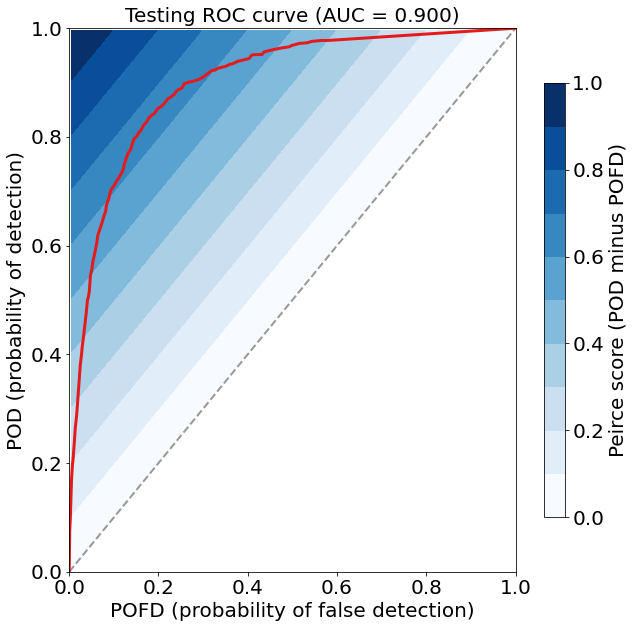

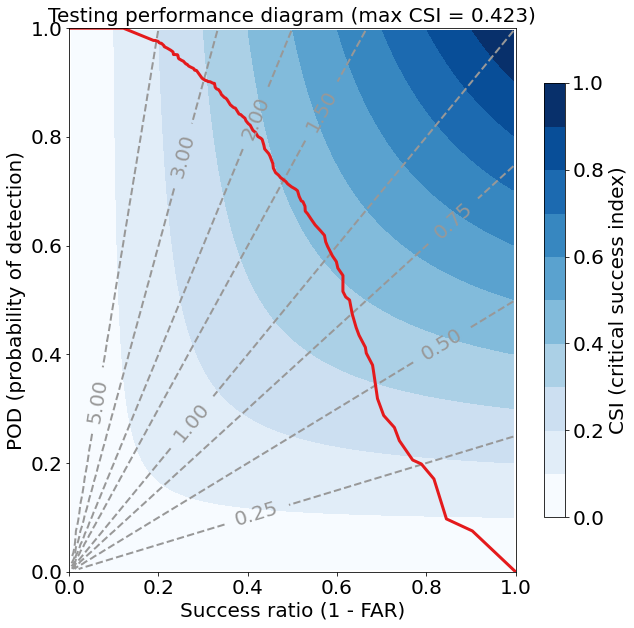

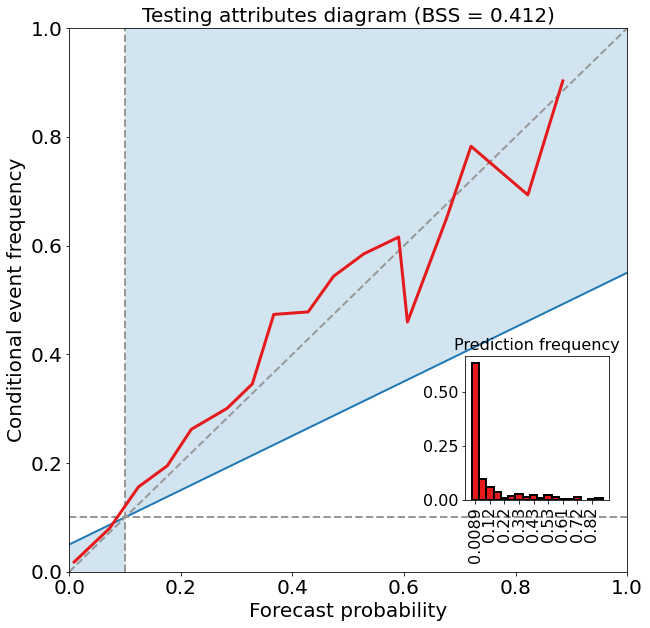

Testing max Peirce score (POD - POFD) = 0.657
Testing AUC (area under ROC curve) = 0.900
Testing max CSI (critical success index) = 0.423
Testing Brier score = 0.053
Testing Brier skill score (improvement over climatology) = 0.412


In [ ]:
best_linear_index = numpy.nanargmax(numpy.ravel(validation_bss_matrix))

best_split_index, best_leaf_index = numpy.unravel_index(
    best_linear_index, validation_bss_matrix.shape
)

best_min_examples_per_split = min_per_split_values[best_split_index]
best_min_examples_per_leaf = min_per_leaf_values[best_leaf_index]
best_validation_bss = numpy.nanmax(validation_bss_matrix)

message_string = (
    'Best validation BSS = {0:.3f} ... corresponding min examples per split'
    ' node = {1:d} ... min examples per leaf node = {2:d}'
).format(
    best_validation_bss, best_min_examples_per_split,
    best_min_examples_per_leaf
)

print(message_string)

final_model_object = utils.setup_classification_tree(
    min_examples_at_split=best_min_examples_per_split,
    min_examples_at_leaf=best_min_examples_per_leaf
)

_ = utils.train_classification_tree(
    model_object=final_model_object,
    training_predictor_table=training_predictor_table,
    training_target_table=training_target_table
)

testing_predictions = final_model_object.predict_proba(
    testing_predictor_table.to_numpy()
)[:, 1]
training_event_frequency = numpy.mean(
    training_target_table[utils.BINARIZED_TARGET_NAME].values
)

_ = utils.eval_binary_classifn(
    observed_labels=
    testing_target_table[utils.BINARIZED_TARGET_NAME].values,
    forecast_probabilities=testing_predictions,
    training_event_frequency=training_event_frequency,
    create_plots=True, verbose=True, dataset_name='testing'
)

# Random forests

## Theory

 - **A random forest is an ensemble of decision trees.**
 - In the first example with decision trees, you may have noticed a lot of **overfitting.**
 - **This is generally a problem with decision trees**, because they rely on exact thresholds, which introduce "jumps" into the decision function.
 - For example, in the tree shown below, a difference of 0.0001 J kg$^{-1}$ in CAPE could lead to a difference of 55% in tornado probability.
<br>

<center><img src="https://raw.githubusercontent.com/thunderhoser/cira_ml_short_course/master/tree_schematic.jpg" alt="Decision-tree schematic" width="750" /></center>
<br>

 - One way to mitigate this overfitting is: train a bunch of decision trees.
 - **If the decision trees are diverse enough, they will hopefully have offsetting biases** (overfit in different ways).
 - **Random forests ensure diversity in two ways:**
     - Example-bagging
     - Predictor-bagging (or "feature-bagging")
<br><br>

 - **Example-bagging** is done by training each tree with a **bootstrapped replicate** of the training data.
 - For a training set with $N$ examples, **a "bootstrapped replicate" is created by randomly sampling $N$ examples with replacement.**
 - Sampling with replacement leads to duplicates.  On average, each bootstrapped replicate contains only 63.2% ($1 - e^{-1}$) of unique examples, with the other 37.8% being duplicates.
 - This ensures that each tree is trained with a different set of unique examples.
<br><br>
 - **Predictor-bagging** is done by looping over a random subset of predictors at each branch node.
 - In other words, instead of trying all predictors to find the best question, try only a few predictors.
 - If there are $M$ predictors, the general rule is to try $\sqrt{M}$ predictors at each branch node.
 - In our case there are 41 predictors, so each branch node will loop over 6 randomly chosen predictors.
<br><br>

<center><img src="https://raw.githubusercontent.com/thunderhoser/cira_ml_short_course/master/random_forest_schematic.png" alt="Random-forest schematic" width="500" /></center>
<center>(Image credit: https://www.towardsdatascience.com/decision-trees-and-random-forests-for-classification-and-regression-pt-2-2b1fcd03e342)</center>

## Training

The next cell trains a random forest with the following hyperparameters:

 - 100 trees
 - 6 predictors attempted at each leaf node
 - Minimum of 500 examples at a branch node
 - Minimum of 200 examples at a leaf node

In [ ]:
num_predictors = len(list(training_predictor_table))
max_predictors_per_split = int(numpy.round(
    numpy.sqrt(num_predictors)
))

random_forest_model_object = utils.setup_classification_forest(
    max_predictors_per_split=max_predictors_per_split,
    num_trees=100, min_examples_at_split=500, min_examples_at_leaf=200
)

_ = utils.train_classification_forest(
    model_object=random_forest_model_object,
    training_predictor_table=training_predictor_table,
    training_target_table=training_target_table
)

building tree 1 of 100


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


building tree 2 of 100
building tree 3 of 100
building tree 4 of 100
building tree 5 of 100
building tree 6 of 100
building tree 7 of 100
building tree 8 of 100
building tree 9 of 100
building tree 10 of 100
building tree 11 of 100
building tree 12 of 100
building tree 13 of 100
building tree 14 of 100
building tree 15 of 100
building tree 16 of 100
building tree 17 of 100
building tree 18 of 100
building tree 19 of 100
building tree 20 of 100
building tree 21 of 100
building tree 22 of 100
building tree 23 of 100
building tree 24 of 100
building tree 25 of 100
building tree 26 of 100
building tree 27 of 100
building tree 28 of 100
building tree 29 of 100
building tree 30 of 100
building tree 31 of 100
building tree 32 of 100
building tree 33 of 100
building tree 34 of 100
building tree 35 of 100
building tree 36 of 100
building tree 37 of 100
building tree 38 of 100
building tree 39 of 100
building tree 40 of 100
building tree 41 of 100
building tree 42 of 100
building tree 43 of 100


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   46.1s finished


## Evaluation

The next cell evaluates the model we just trained.

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    1.4s finished


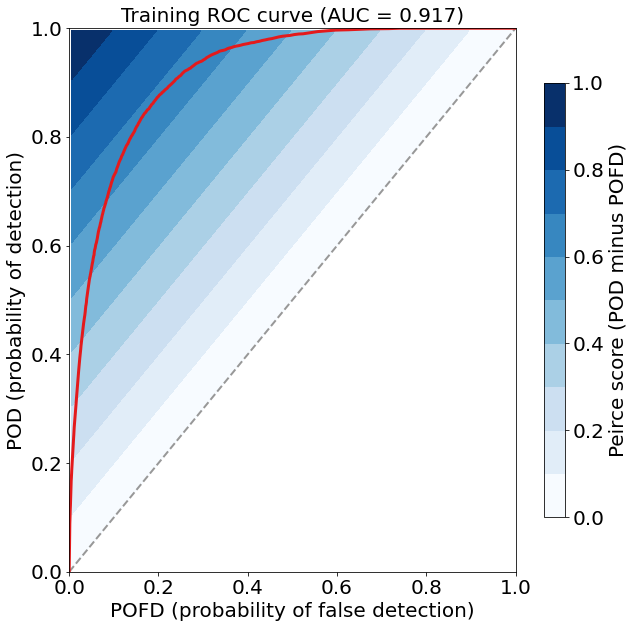

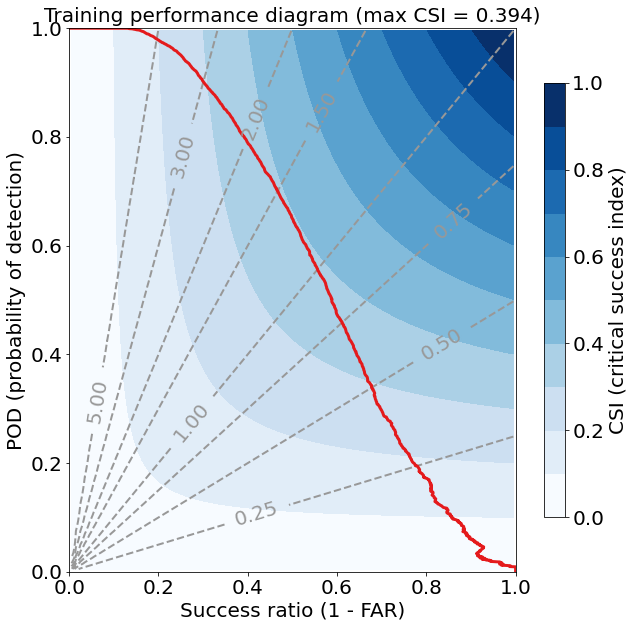

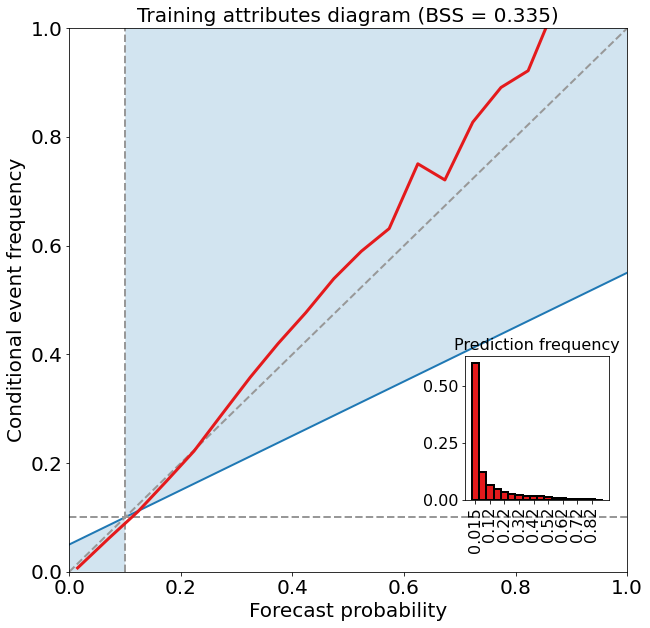

Training max Peirce score (POD - POFD) = 0.675
Training AUC (area under ROC curve) = 0.917
Training max CSI (critical success index) = 0.394
Training Brier score = 0.060
Training Brier skill score (improvement over climatology) = 0.335


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.5s finished


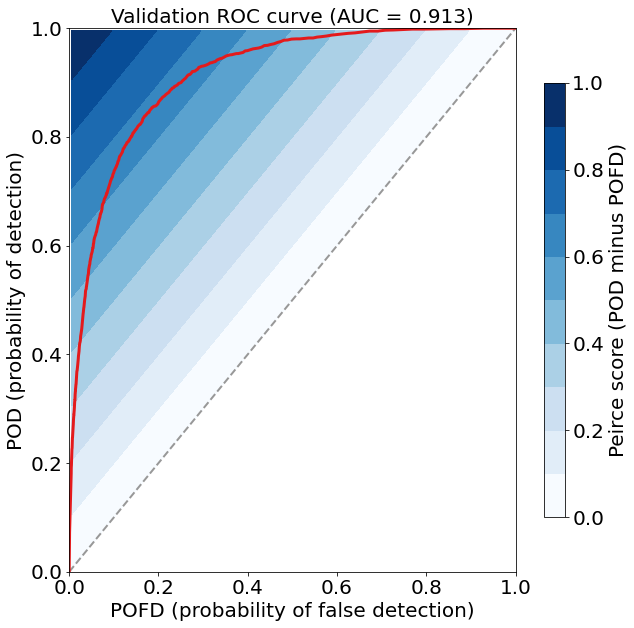

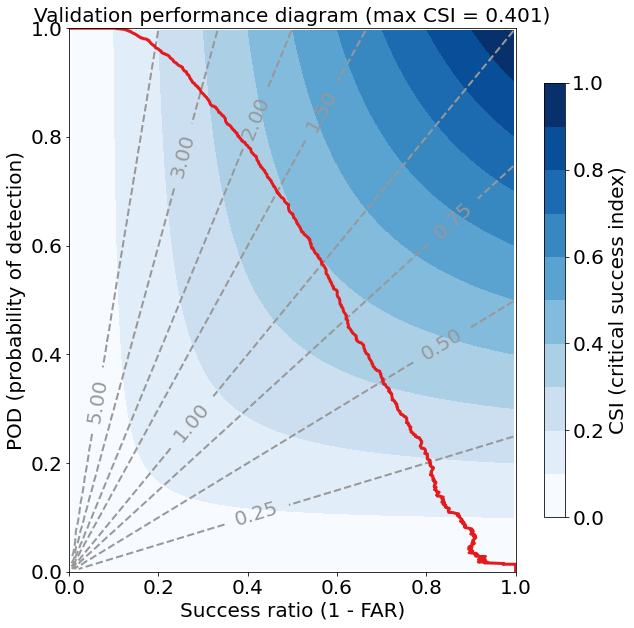

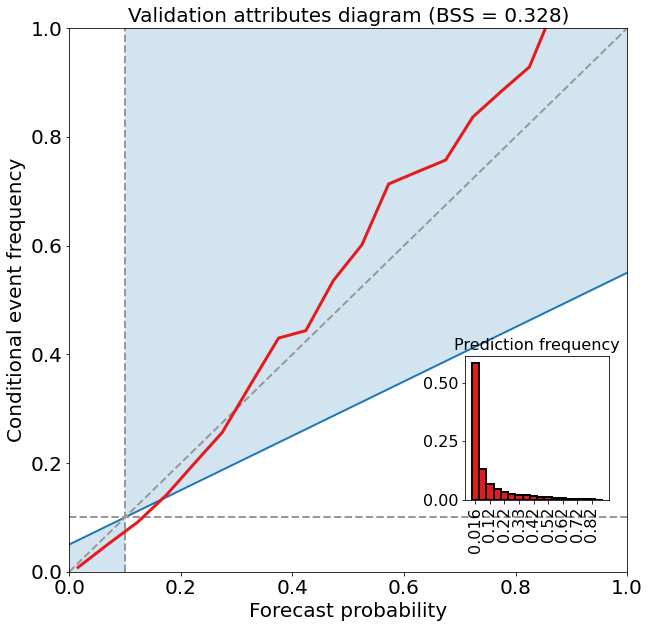

Validation max Peirce score (POD - POFD) = 0.670
Validation AUC (area under ROC curve) = 0.913
Validation max CSI (critical success index) = 0.401
Validation Brier score = 0.061
Validation Brier skill score (improvement over climatology) = 0.328


In [ ]:
training_probabilities = random_forest_model_object.predict_proba(
    training_predictor_table.to_numpy()
)[:, 1]
training_event_frequency = numpy.mean(
    training_target_table[utils.BINARIZED_TARGET_NAME].values
)

_ = utils.eval_binary_classifn(
    observed_labels=
    training_target_table[utils.BINARIZED_TARGET_NAME].values,
    forecast_probabilities=training_probabilities,
    training_event_frequency=training_event_frequency,
    dataset_name='training'
)

validation_probabilities = random_forest_model_object.predict_proba(
    validation_predictor_table.to_numpy()
)[:, 1]

_ = utils.eval_binary_classifn(
    observed_labels=
    validation_target_table[utils.BINARIZED_TARGET_NAME].values,
    forecast_probabilities=validation_probabilities,
    training_event_frequency=training_event_frequency,
    dataset_name='validation'
)

## Exercise

Train a random forest with different hyperparameters.  Investigate performance on the training and validation data.

In [ ]:
# Insert code here.

# Gradient-boosted forests

## Theory

 - **Gradient-boosting is another way to ensemble decision trees.**
 - In a random forest the trees are trained independently of each other.
 - In a gradient-boosted forest, the $k^{\textrm{th}}$ tree is trained to fit residuals from the first $k$ - 1 trees.
 - The "residual" for the $i^{\textrm{th}}$ example is $y_i - p_i$, where $y_i$ = true label (1 for event, 0 for non-event) and $p_i$ = forecast probability of event.
<br><br>

<center><img src="https://raw.githubusercontent.com/thunderhoser/cira_ml_short_course/master/gbf_schematic1.png" width="750" /></center>
<center>(Image credit: https://www.researchgate.net/figure/Schematical-representation-of-gradient-boosting-regression-in-regards-to-algorithm_fig3_340524896)</center>
<br><br>

<center><img src="https://raw.githubusercontent.com/thunderhoser/cira_ml_short_course/master/gbf_schematic2.jpeg" /></center>
<center>(Image credit: https://medium.com/@6453gobind/gradient-boosting-15ecc572a988)</center>
<br><br>

 - Gradient-boosted forests can still use example-bagging and predictor-bagging.
 - However, in most libraries the default is no example-bagging or predictor-bagging (train each tree with all examples and attempt all predictors at each branch node).
<br><br>
 - In a random forest the trees can be trained in parallel (each tree is independent of the others), which makes random forests faster.
 - In a gradient-boosted forests the trees must be trained in series, which makes them slower.
 - However, **in practice gradient-boosting usually outperforms random forests.**
 - In a recent contest for solar-energy prediction, the top 3 teams all used gradient-boosted forests (McGovern *et al*. 2015).

## Training

The next cell trains a gradient-boosted forests with the following hyperparameters:

 - No example-bagging
 - No predictor-bagging
 - 100 trees
 - Minimum of 500 examples at a branch node
 - Minimum of 200 examples at a leaf node

In [ ]:
num_predictors = len(list(training_predictor_table))

gbt_model_object = utils.setup_classification_forest(
    max_predictors_per_split=num_predictors, num_trees=100,
    min_examples_at_split=500, min_examples_at_leaf=200
)

_ = utils.train_classification_gbt(
    model_object=gbt_model_object,
    training_predictor_table=training_predictor_table,
    training_target_table=training_target_table
)

building tree 1 of 100


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.9s remaining:    0.0s


building tree 2 of 100
building tree 3 of 100
building tree 4 of 100
building tree 5 of 100
building tree 6 of 100
building tree 7 of 100
building tree 8 of 100
building tree 9 of 100
building tree 10 of 100
building tree 11 of 100
building tree 12 of 100
building tree 13 of 100
building tree 14 of 100
building tree 15 of 100
building tree 16 of 100
building tree 17 of 100
building tree 18 of 100
building tree 19 of 100
building tree 20 of 100
building tree 21 of 100
building tree 22 of 100
building tree 23 of 100
building tree 24 of 100
building tree 25 of 100
building tree 26 of 100
building tree 27 of 100
building tree 28 of 100
building tree 29 of 100
building tree 30 of 100
building tree 31 of 100
building tree 32 of 100
building tree 33 of 100
building tree 34 of 100
building tree 35 of 100
building tree 36 of 100
building tree 37 of 100
building tree 38 of 100
building tree 39 of 100
building tree 40 of 100
building tree 41 of 100
building tree 42 of 100
building tree 43 of 100


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:  4.7min finished


## Evaluation

The next cell evaluates the model we just trained.

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    1.0s finished


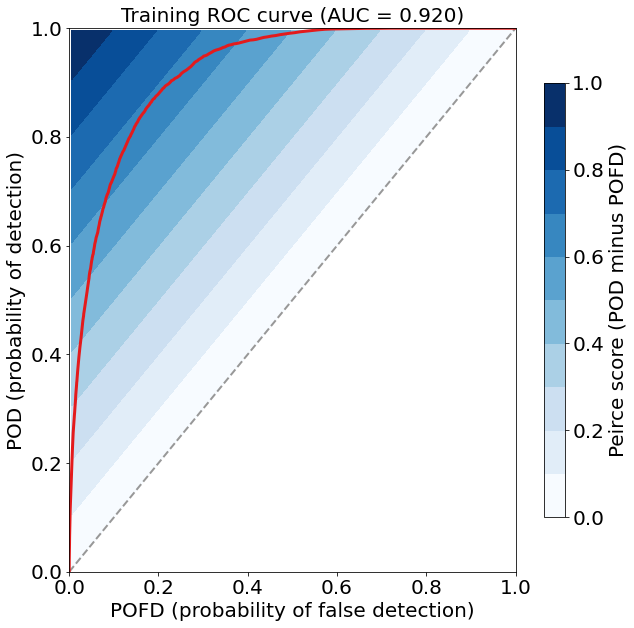

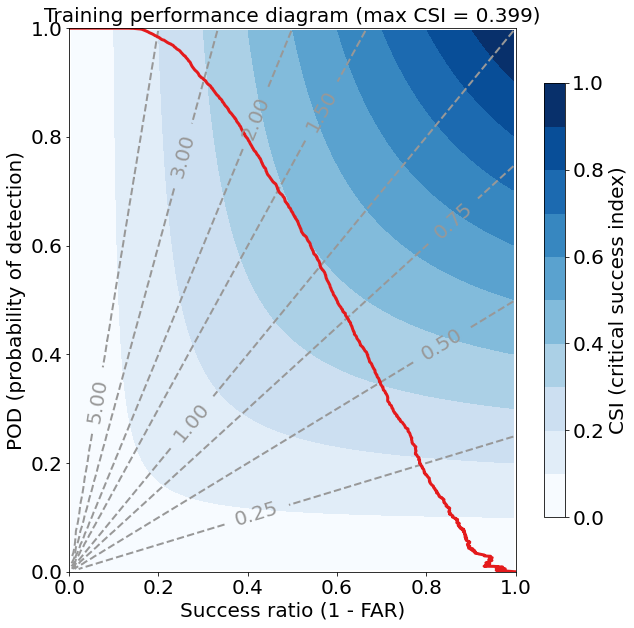

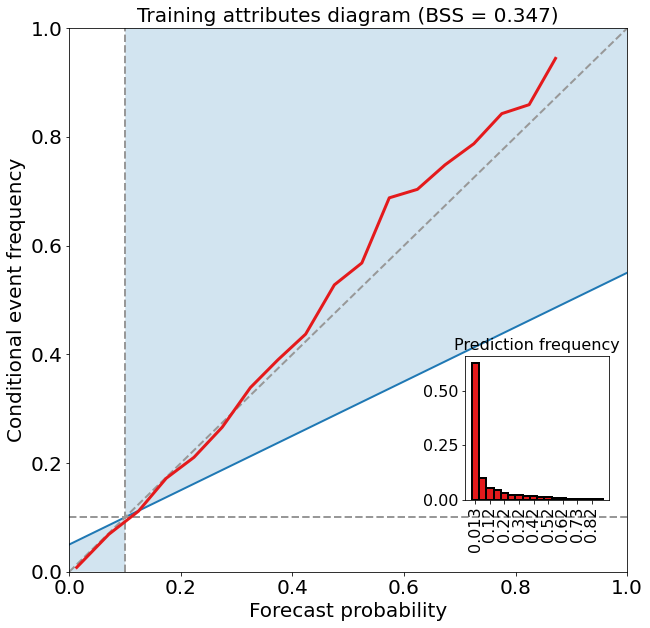

Training max Peirce score (POD - POFD) = 0.681
Training AUC (area under ROC curve) = 0.920
Training max CSI (critical success index) = 0.399
Training Brier score = 0.059
Training Brier skill score (improvement over climatology) = 0.347


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.3s finished


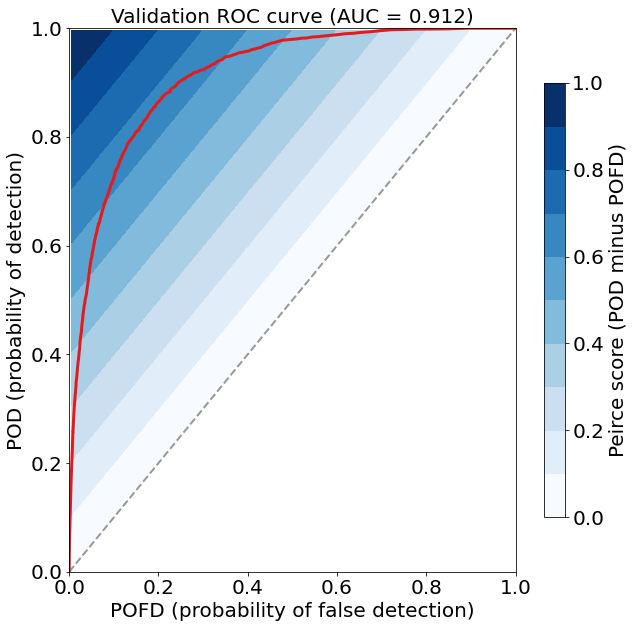

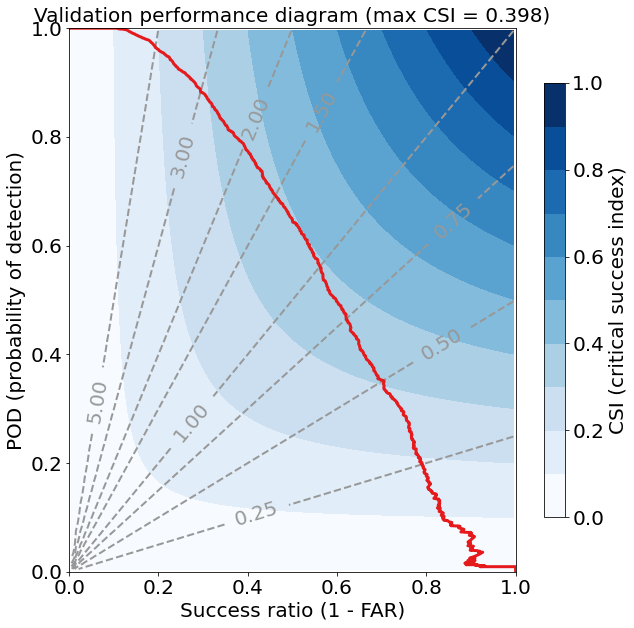

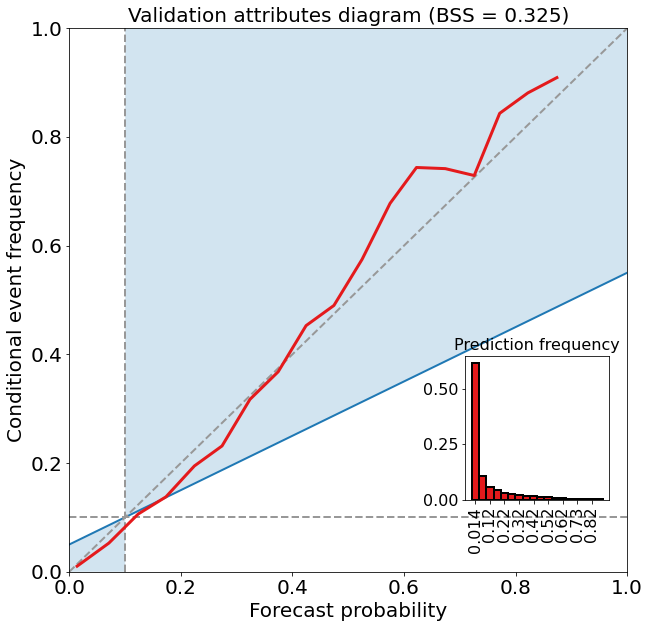

Validation max Peirce score (POD - POFD) = 0.665
Validation AUC (area under ROC curve) = 0.912
Validation max CSI (critical success index) = 0.398
Validation Brier score = 0.061
Validation Brier skill score (improvement over climatology) = 0.325


In [ ]:
training_probabilities = gbt_model_object.predict_proba(
    training_predictor_table.to_numpy()
)[:, 1]
training_event_frequency = numpy.mean(
    training_target_table[utils.BINARIZED_TARGET_NAME].values
)

_ = utils.eval_binary_classifn(
    observed_labels=
    training_target_table[utils.BINARIZED_TARGET_NAME].values,
    forecast_probabilities=training_probabilities,
    training_event_frequency=training_event_frequency,
    dataset_name='training'
)

validation_probabilities = gbt_model_object.predict_proba(
    validation_predictor_table.to_numpy()
)[:, 1]

_ = utils.eval_binary_classifn(
    observed_labels=
    validation_target_table[utils.BINARIZED_TARGET_NAME].values,
    forecast_probabilities=validation_probabilities,
    training_event_frequency=training_event_frequency,
    dataset_name='validation'
)

# *K*-means clustering

## Theory

**$K$-means is a clustering algorithm that works as follows:**

 1. Choose desired number of clusters.
 2. Initialize cluster centroids.  Each cluster centroid is a vector with the same dimensions as the predictor data.  In our case there are 41 predictors, so each cluster centroid is a length-41 vector.
 3. Assign each training example $\vec{x}$ to the nearest cluster centroid $\vec{c}$.  "Nearest" is based on the Euclidean distance between $\vec{x}$ and $\vec{c}$.  In our case $\vec{x}$ and $\vec{c}$ are 41-dimensional, so distance is hard to visualize.
 4. Recompute cluster centroids.  For cluster j, the centroid $\vec{c}_j$ is the elementwise average of all training examples assigned to j.
 5. Repeat steps 3-4 for many iterations.
<br>

**A 2-D example (where there are only 2 predictors) is shown below.**
<br>

<center><img src="https://raw.githubusercontent.com/thunderhoser/cira_ml_short_course/master/k_means.gif" alt="K-means animation" width="500" /></center>
<center>(Image credit: https://upload.wikimedia.org/wikipedia/commons/e/ea/K-means_convergence.gif)</center>
<br><br>

- **$K$-means is an example of unsupervised learning.**
- All foregoing examples (linear/logistic regression, trees, forests) are supervised learning.
- **In supervised learning, there is a target variable (or several target variables) and correct answers are provided to the model during training.**
- **In unsupervised learning, correct answers for the target variable are not provided to the model during training.**
- In fact, there may be no target variable (unsupervised learning, especially clustering, is often used for exploratory data analysis).
<br><br>

**When clustering (*K*-means or any other method) is used to predict a target variable, the procedure is as follows:**

 1. Train the model (using predictor variables only).
 2. Find the example that you want to predict.  Let $\vec{x}$ be the predictor data for this example.
 3. Find the cluster with the centroid nearest to $\vec{x}$.  Let this be cluster $j$.
 4. Find all training examples assigned to cluster $j$.  Find the average target value ($\overline{y}$) for these training examples.
 5. $\overline{y}$ is the predicted target value for the new example.

## Training

The next cell trains a *K*-means model with the following hyperparameters:

 - 10 clusters
 - 300 iterations or epochs (number of times clusters are updated)

Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 1649217.7383861437
start iteration
done sorting
end inner loop
Iteration 1, inertia 1579411.2324157094
start iteration
done sorting
end inner loop
Iteration 2, inertia 1551993.0988184684
start iteration
done sorting
end inner loop
Iteration 3, inertia 1536796.0259663826
start iteration
done sorting
end inner loop
Iteration 4, inertia 1528611.3155551527
start iteration
done sorting
end inner loop
Iteration 5, inertia 1524027.3419462317
start iteration
done sorting
end inner loop
Iteration 6, inertia 1521243.0597389047
start iteration
done sorting
end inner loop
Iteration 7, inertia 1519235.7347409585
start iteration
done sorting
end inner loop
Iteration 8, inertia 1517703.5302764429
start iteration
done sorting
end inner loop
Iteration 9, inertia 1516462.3802428266
start iteration
done sorting
end inner loop
Iteration 10, inertia 1515490.074814876
start iteration
done sorting
end inner loop
Iteratio

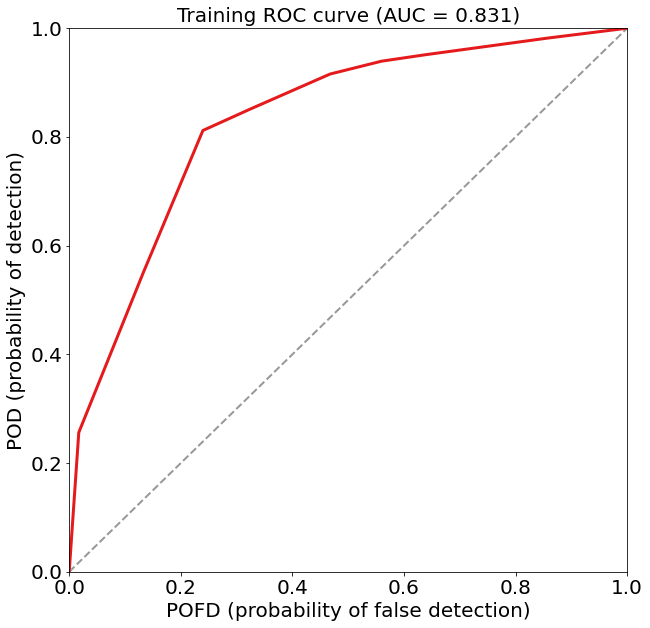

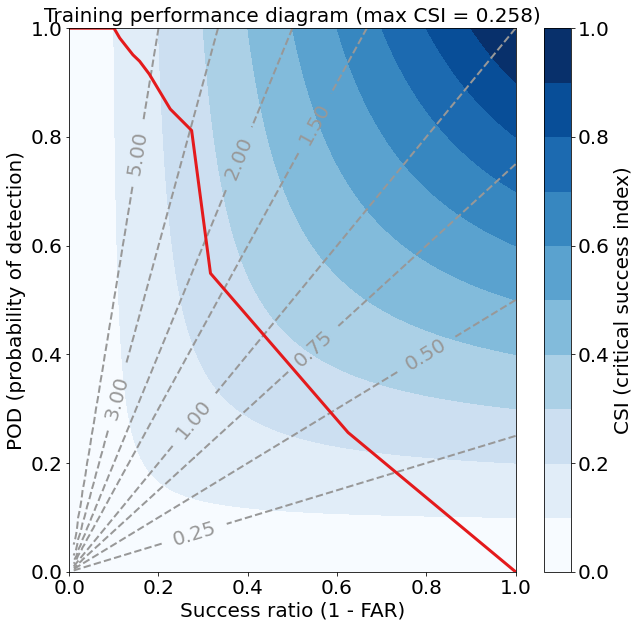

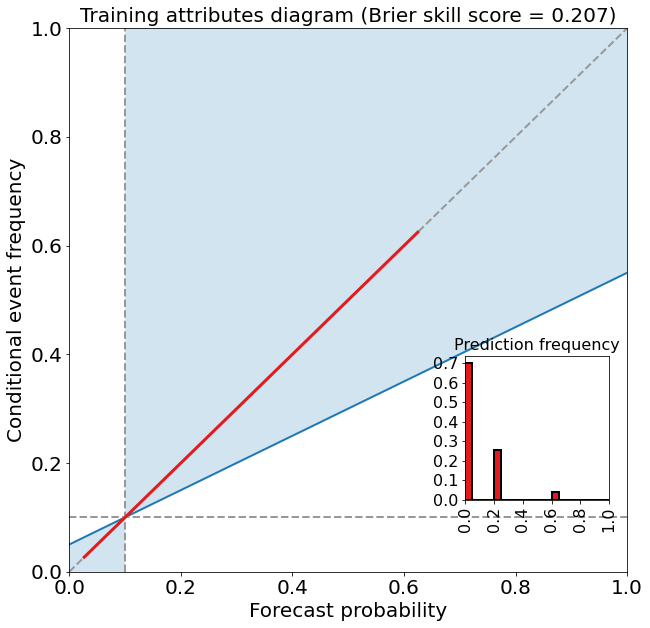

Training max Peirce score (POD - POFD) = 0.572
Training AUC (area under ROC curve) = 0.831
Training max CSI (critical success index) = 0.258
Training Brier score = 0.072
Training Brier skill score (improvement over climatology) = 0.207


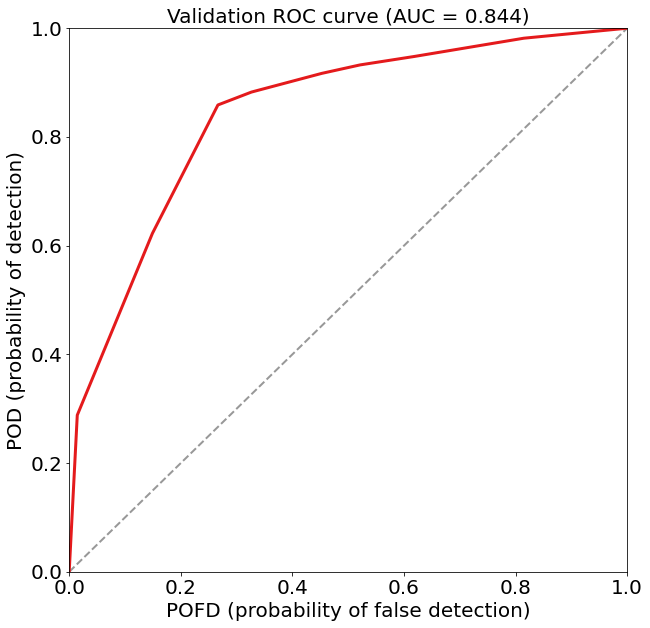

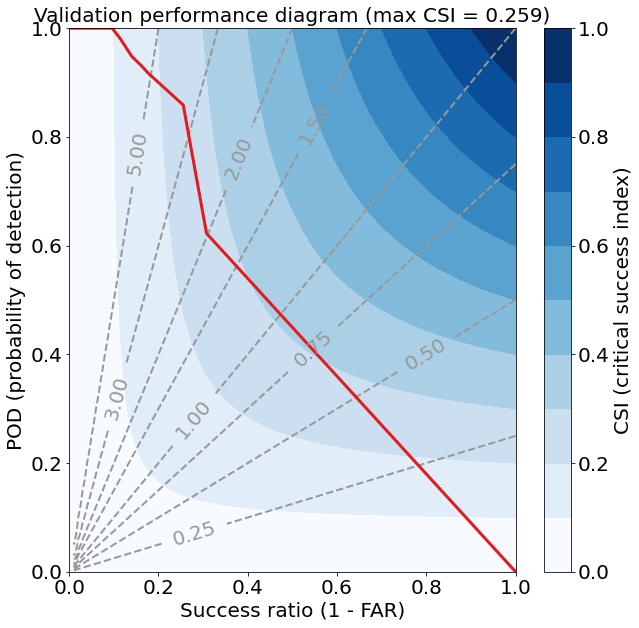

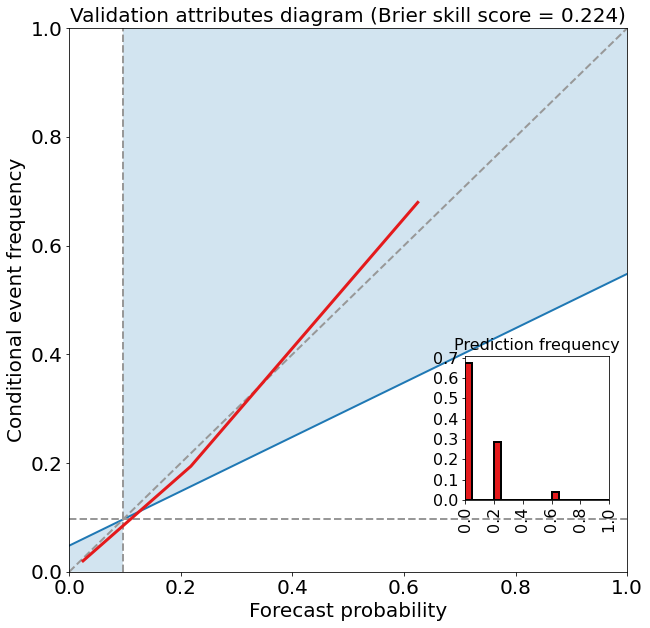

Validation max Peirce score (POD - POFD) = 0.592
Validation AUC (area under ROC curve) = 0.844
Validation max CSI (critical success index) = 0.259
Validation Brier score = 0.070
Validation Brier skill score (improvement over climatology) = 0.224


In [ ]:
k_means_model_object = utils.setup_k_means(num_clusters=10, num_iterations=300)

k_means_model_object = utils.train_clustering_model(
    model_object=k_means_model_object,
    training_predictor_table=training_predictor_table
)

## Evaluation

The next cell evaluates the model we just trained.

In [ ]:
training_probabilities = utils.use_k_means_for_classifn(
    model_object=k_means_model_object,
    training_target_table=training_target_table,
    new_predictor_table=training_predictor_table
)
training_event_frequency = numpy.mean(
    training_target_table[utils.BINARIZED_TARGET_NAME].values
)

_ = utils.eval_binary_classifn(
    observed_labels=
    training_target_table[utils.BINARIZED_TARGET_NAME].values,
    forecast_probabilities=training_probabilities,
    training_event_frequency=training_event_frequency,
    dataset_name='training'
)

validation_probabilities = utils.use_k_means_for_classifn(
    model_object=k_means_model_object,
    training_target_table=training_target_table,
    new_predictor_table=validation_predictor_table
)

_ = utils.eval_binary_classifn(
    observed_labels=
    validation_target_table[utils.BINARIZED_TARGET_NAME].values,
    forecast_probabilities=validation_probabilities,
    training_event_frequency=training_event_frequency,
    dataset_name='validation'
)

# Tuning *K*-means hyperparameters

 - The most important hyperparameter for *K*-means is the number of clusters (which people call $K$).
 - If $K = 1$, the one cluster contains all training examples, so the model always predicts the average target value in the training data ("climatology").  **This causes the model to underfit.**
 - If $K = N$ (number of training examples), each cluster contains only one training example, so each prediction is based on only one training example.  **This causes the model to overfit.**
<br><br>

**Recall the four steps of any hyperparameter experiment:**

 1. Choose the values to be attempted.  We will try $K \in \lbrace 1, 2, 3, 4, 5, 10, 15, 20, 25, 30, 50, 100 \rbrace$.
 2. Train a model with each combination.
 3. Evaluate each model on the validation data.
 4. Select the model that performs best on validation data.  Here we will define "best" as that with the highest Brier skill score.

## Training

The next cell performs steps 1 and 2 of the hyperparameter experiment (defining the values to be attempted and training the models).

Training model with 1 clusters...


Initialization complete
Iteration  0, inertia 6945577.125
Iteration  1, inertia 3131416.000
Converged at iteration 1: center shift 0.000000e+00 within tolerance 9.999869e-05


**************************************************


Training model with 2 clusters...


Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 2558534.3246657234
start iteration
done sorting
end inner loop
Iteration 1, inertia 2534379.9686685787
start iteration
done sorting
end inner loop
Iteration 2, inertia 2530679.3351502973
start iteration
done sorting
end inner loop
Iteration 3, inertia 2529774.9269479117
start iteration
done sorting
end inner loop
Iteration 4, inertia 2529368.597235499
start iteration
done sorting
end inner loop
Iteration 5, inertia 2529117.4022622183
start iteration
done sorting
end inner loop
Iteration 6, inertia 2528939.7619760577
start iteration
done sorting
end inner loop
Iteration 7, inertia 2528805.433842989
start

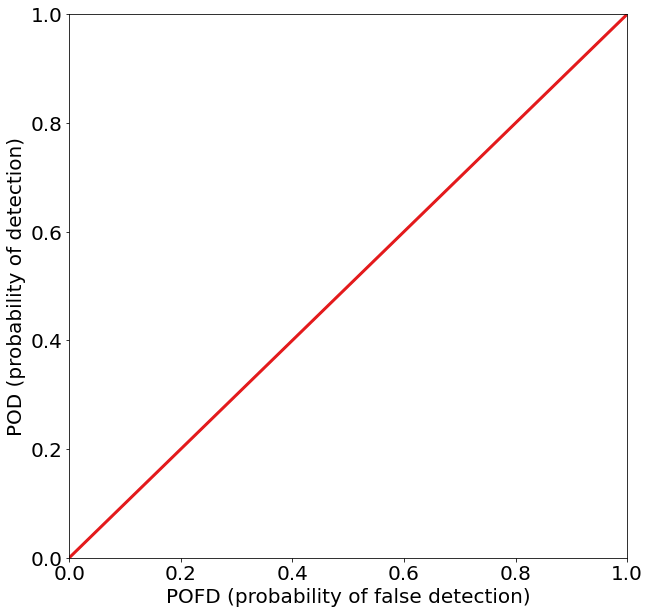

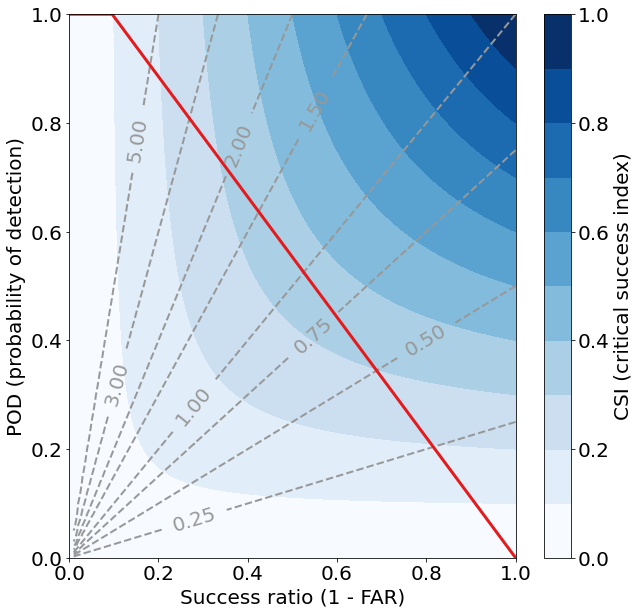

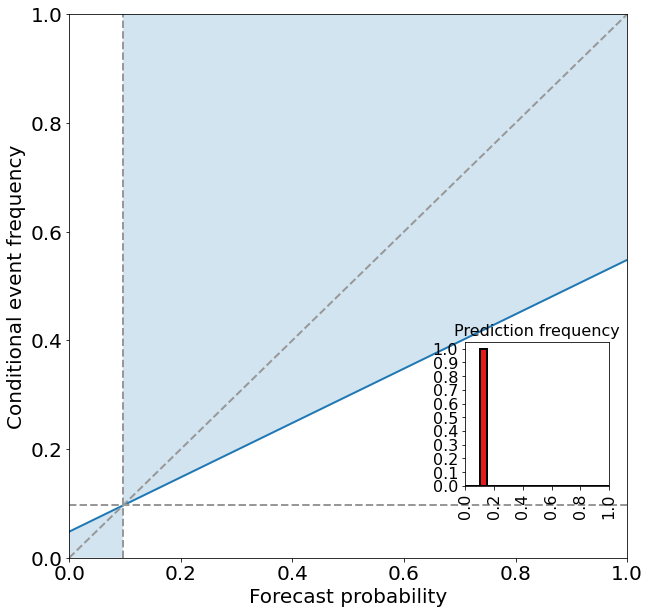

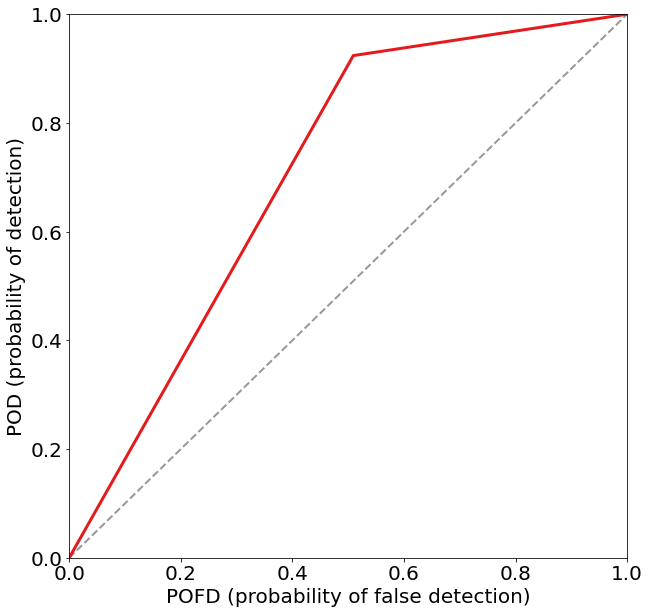

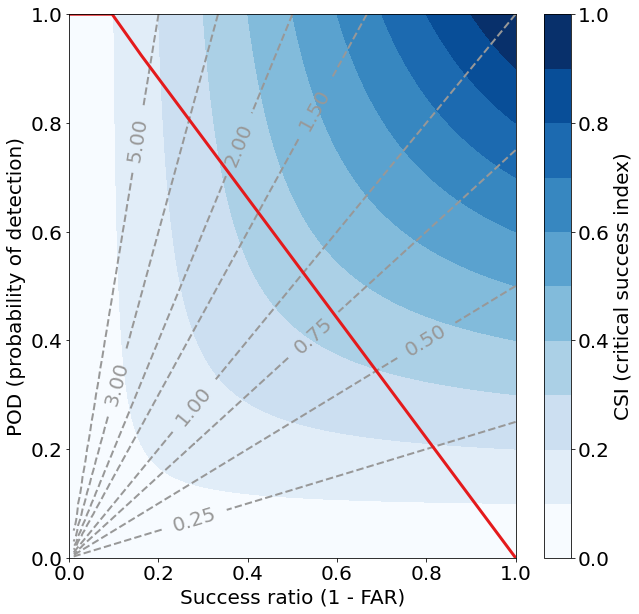

...

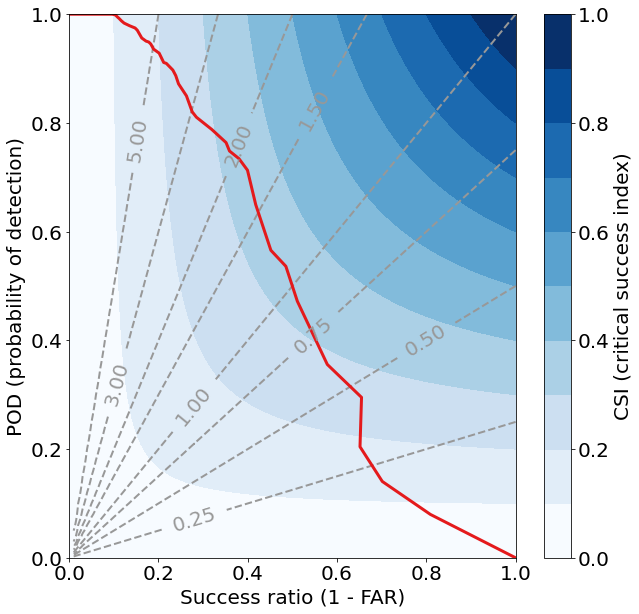

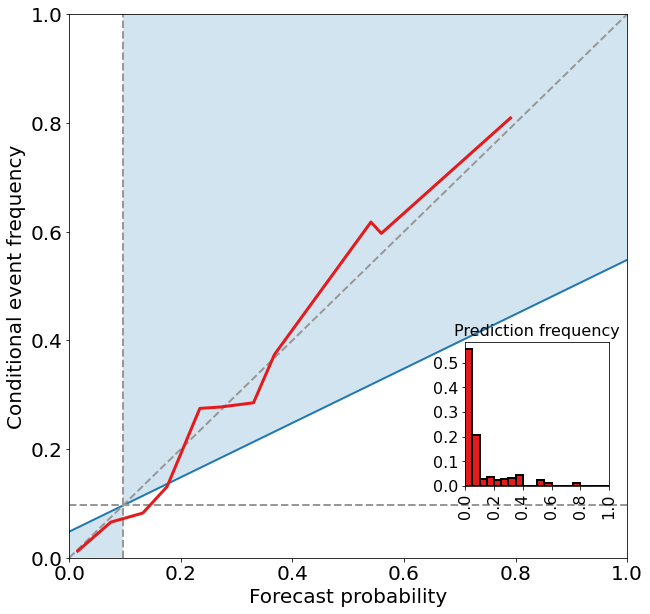

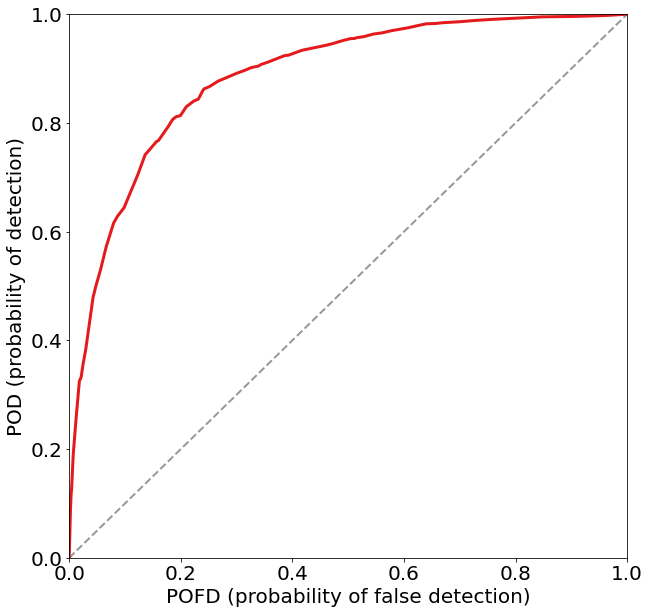

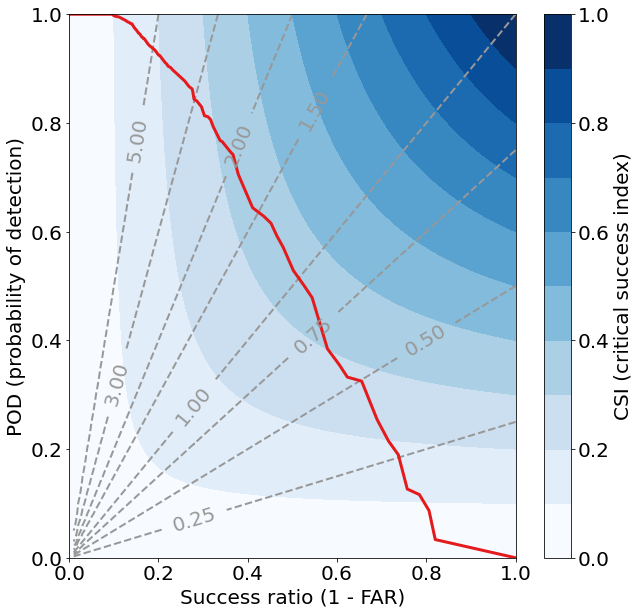

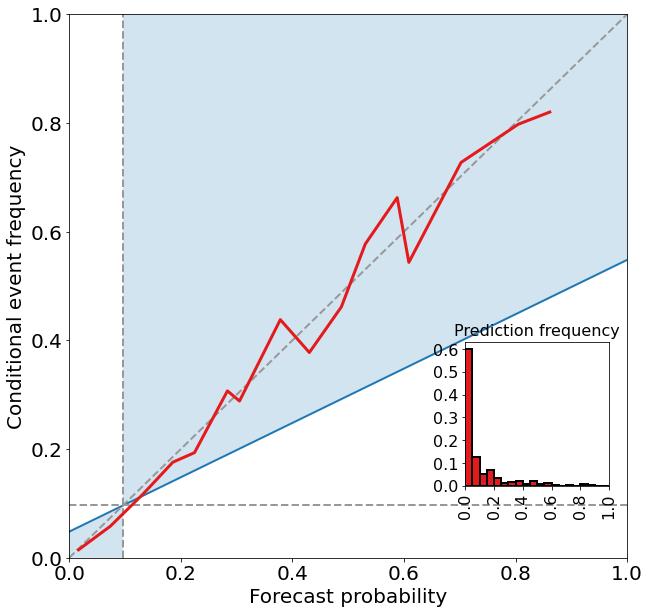

In [ ]:
cluster_counts = numpy.array(
    [1, 2, 3, 4, 5, 10, 15, 20, 25, 30, 50, 100], dtype=int
)
num_cluster_counts = len(cluster_counts)

validation_auc_values = numpy.full(num_cluster_counts, numpy.nan)
validation_max_csi_values = validation_auc_values + 0.
validation_bs_values = validation_auc_values + 0.
validation_bss_values = validation_auc_values + 0.

training_event_frequency = numpy.mean(
    training_target_table[utils.BINARIZED_TARGET_NAME].values
)

for i in range(num_cluster_counts):
    this_message_string = 'Training model with {0:d} clusters...\n\n'.format(
        cluster_counts[i]
    )
    print(this_message_string)

    this_model_object = utils.setup_k_means(
        num_clusters=cluster_counts[i], num_iterations=300
    )

    this_model_object = utils.train_clustering_model(
        model_object=this_model_object,
        training_predictor_table=training_predictor_table
    )
    print(SEPARATOR_STRING)

    these_validation_predictions = utils.use_k_means_for_classifn(
        model_object=this_model_object,
        training_target_table=training_target_table,
        new_predictor_table=validation_predictor_table
    )

    this_evaluation_dict = utils.eval_binary_classifn(
        observed_labels=
        validation_target_table[utils.BINARIZED_TARGET_NAME].values,
        forecast_probabilities=these_validation_predictions,
        training_event_frequency=training_event_frequency,
        create_plots=False, verbose=False
    )

    validation_auc_values[i] = this_evaluation_dict[utils.AUC_KEY]
    validation_max_csi_values[i] = this_evaluation_dict[utils.MAX_CSI_KEY]
    validation_bs_values[i] = this_evaluation_dict[utils.BRIER_SCORE_KEY]
    validation_bss_values[i] = this_evaluation_dict[utils.BRIER_SKILL_SCORE_KEY]

## Validation

The next cell performs step 3 of the hyperparameter experiment (evaluates each model on the validation data).

Text(0.5, 1.0, 'Brier skill score on validation data')

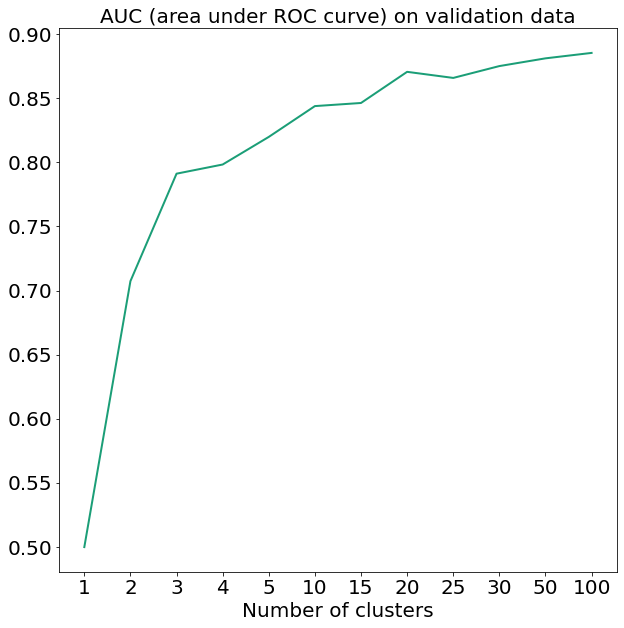

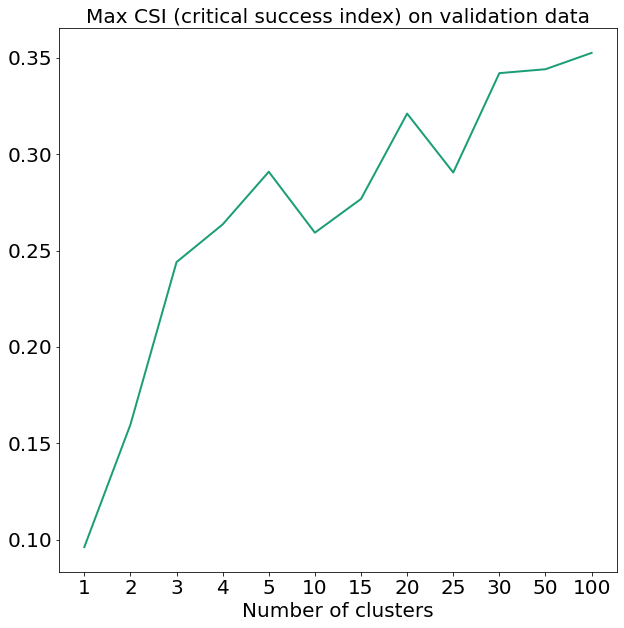

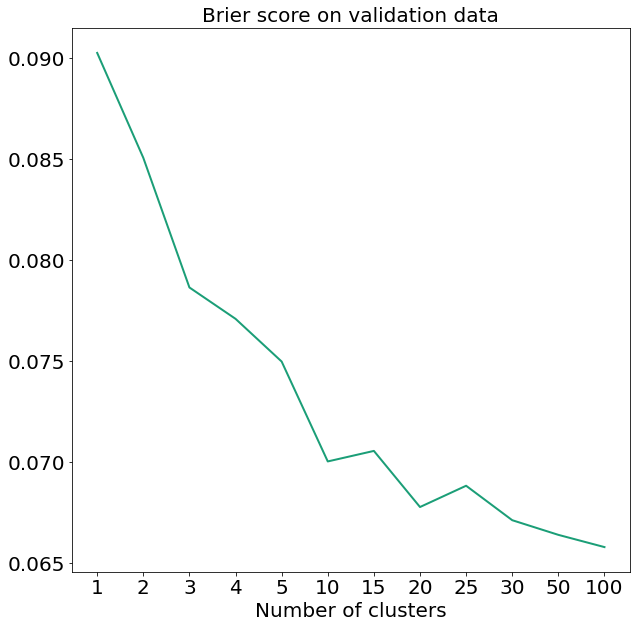

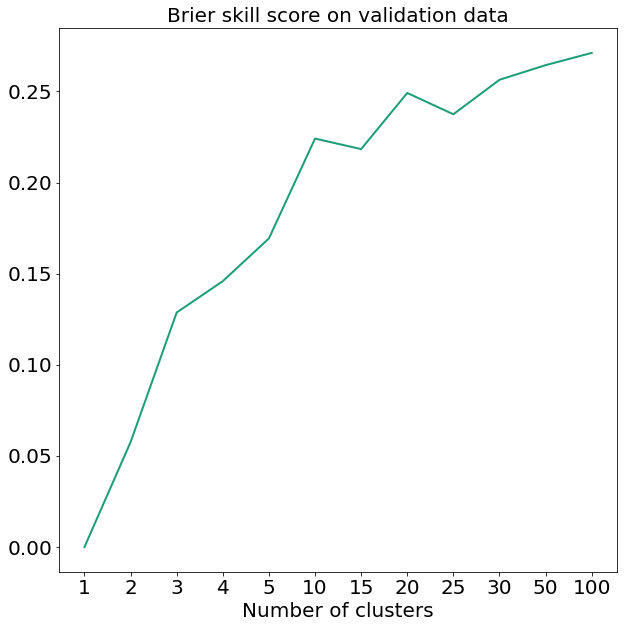

In [ ]:
utils.plot_scores_1d(
    score_values=validation_auc_values, x_tick_labels=cluster_counts
)
pyplot.xlabel('Number of clusters')
pyplot.title('AUC (area under ROC curve) on validation data')

utils.plot_scores_1d(
    score_values=validation_max_csi_values, x_tick_labels=cluster_counts
)
pyplot.xlabel('Number of clusters')
pyplot.title('Max CSI (critical success index) on validation data')

utils.plot_scores_1d(
    score_values=validation_bs_values, x_tick_labels=cluster_counts
)
pyplot.xlabel('Number of clusters')
pyplot.title('Brier score on validation data')

utils.plot_scores_1d(
    score_values=validation_bss_values, x_tick_labels=cluster_counts
)
pyplot.xlabel('Number of clusters')
pyplot.title('Brier skill score on validation data')

## Selection

The next cell performs step 4 of the hyperparameter experiment (select model).

In [ ]:
best_index = numpy.nanargmax(validation_bss_values)
best_cluster_count = cluster_counts[best_index]
best_validation_bss = numpy.nanmax(validation_bss_values)

message_string = (
    'Best validation BSS = {0:.3f} ... corresponding num clusters = {1:d}'
).format(
    best_validation_bss, best_cluster_count
)

print(message_string)

final_model_object = utils.setup_k_means(
    num_clusters=best_cluster_count, num_iterations=300
)

final_model_object = utils.train_clustering_model(
    model_object=final_model_object,
    training_predictor_table=training_predictor_table
)
print(SEPARATOR_STRING)

testing_predictions = utils.use_k_means_for_classifn(
    model_object=final_model_object,
    training_target_table=training_target_table,
    new_predictor_table=testing_predictor_table
)

training_event_frequency = numpy.mean(
    training_target_table[utils.BINARIZED_TARGET_NAME].values
)

_ = utils.eval_binary_classifn(
    observed_labels=
    testing_target_table[utils.BINARIZED_TARGET_NAME].values,
    forecast_probabilities=testing_predictions,
    training_event_frequency=training_event_frequency,
    create_plots=True, verbose=True, dataset_name='testing'
)

Initialization complete
start iteration
done sorting
end inner loop
Iteration 0, inertia 920859.7943015137
start iteration
done sorting
end inner loop
Iteration 1, inertia 869226.7770480115
start iteration
done sorting
end inner loop
Iteration 2, inertia 853441.83571945
start iteration
done sorting
end inner loop
Iteration 3, inertia 845092.9420807762
start iteration
done sorting
end inner loop
Iteration 4, inertia 839345.7921366594
start iteration
done sorting
end inner loop
Iteration 5, inertia 835004.5137896972
start iteration
done sorting
end inner loop
Iteration 6, inertia 832136.5639268147
start iteration
done sorting
end inner loop
Iteration 7, inertia 830172.884486604
start iteration
done sorting
end inner loop
Iteration 8, inertia 828597.1267582243
start iteration
done sorting
end inner loop
Iteration 9, inertia 827338.8925579606
start iteration
done sorting
end inner loop
Iteration 10, inertia 826304.4324630902
start iteration
done sorting
end inner loop
Iteration 11, inertia

NameError: ignored

# Agglomerative hierarchical clustering (AHC)

## Theory

**AHC is a clustering algorithm that works as follows:**

 1. Start with singleton clusters.  In other words, each training example makes up its own cluster, containing one member.  For each cluster, the centroid $\vec{c}$ is the predictor vector $\vec{x}$ for the one example in the cluster.
 2. Find the pair of clusters with the nearest centroids, where "nearest" is based on Euclidean distance.  Let these clusters be $i$ and $j$.
 3. Merge clusters $i$ and $j$ and compute the centroid for the new cluster.
 4. Repeat steps 2 and 3 until there is only one cluster, containing all the training data.
<br>

**A 2-D example (where there are only 2 predictors) is shown below.**
<br>

<center><img src="https://raw.githubusercontent.com/thunderhoser/cira_ml_short_course/master/ahc.gif" alt="K-means animation" width="750" /></center>
<center>(Image credit: https://dashee87.github.io/data%20science/general/Clustering-with-Scikit-with-GIFs/)</center>
<br><br>

**Like *K*-means, AHC is an example of unsupervised learning.**

## Training

The next cell trains an AHC model with 10 clusters.

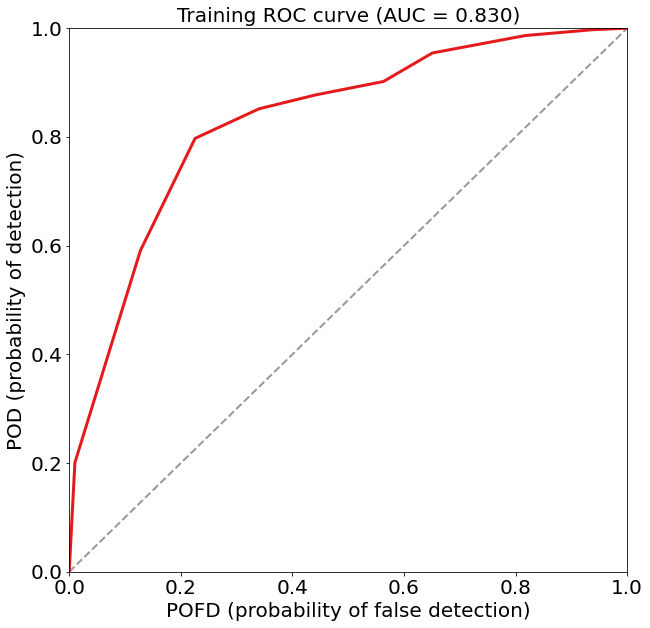

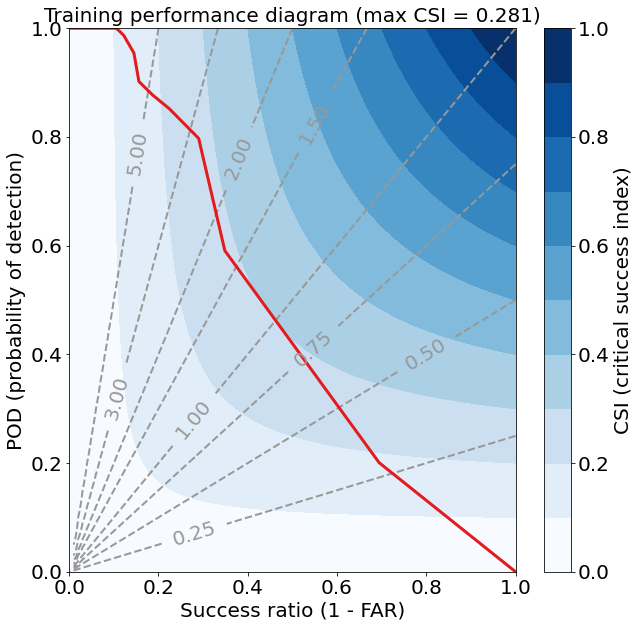

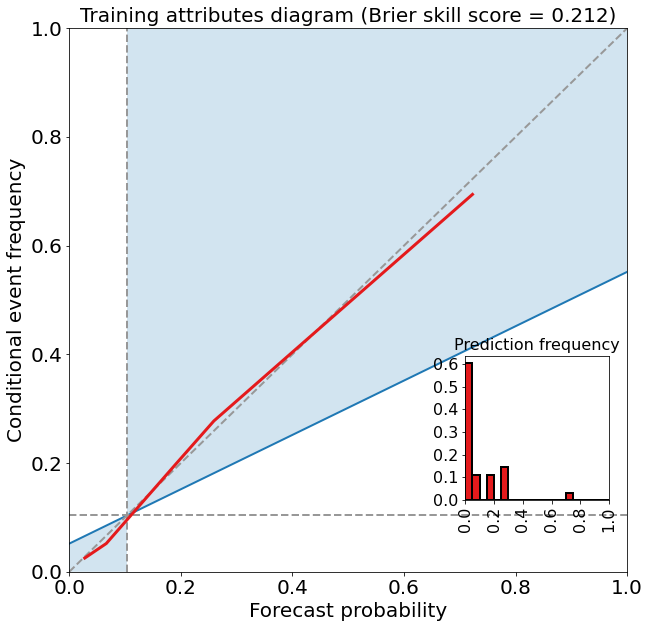

Training max Peirce score (POD - POFD) = 0.572
Training AUC (area under ROC curve) = 0.830
Training max CSI (critical success index) = 0.281
Training Brier score = 0.073
Training Brier skill score (improvement over climatology) = 0.212


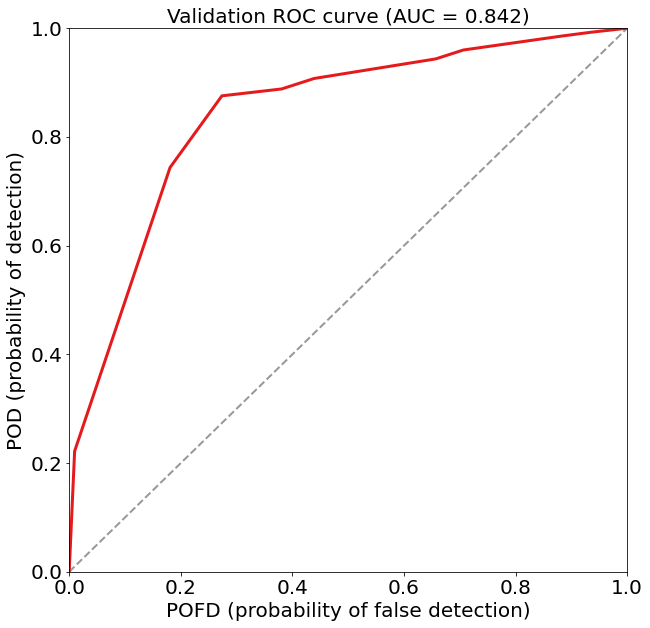

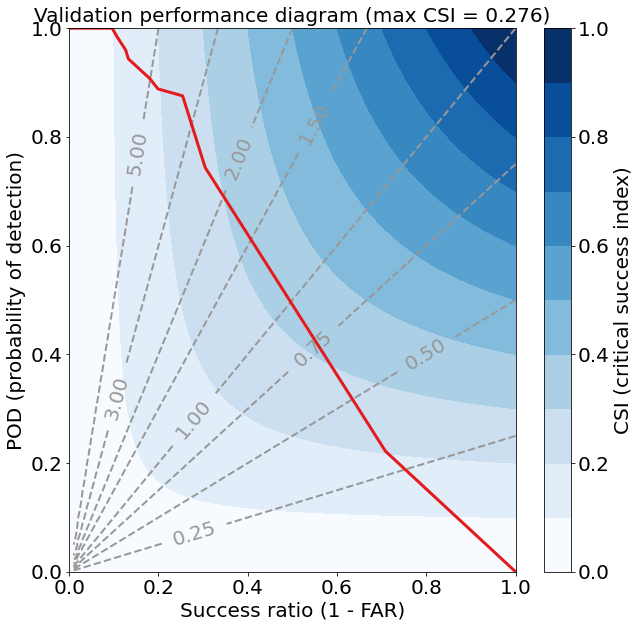

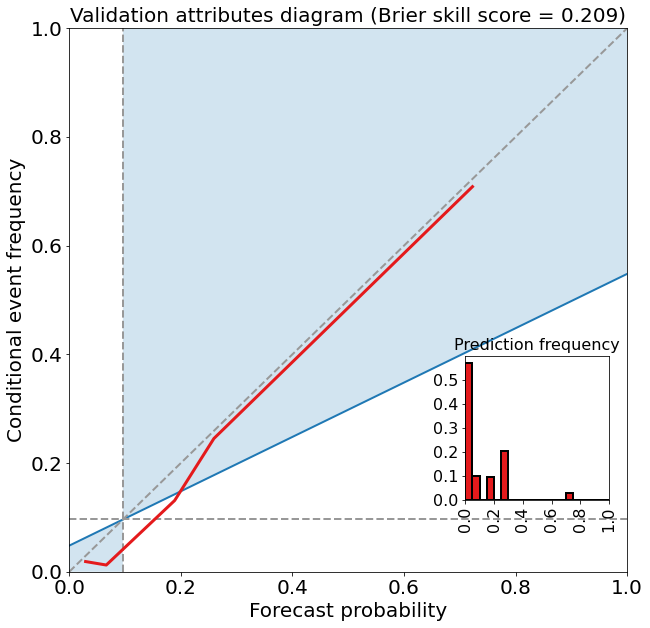

Validation max Peirce score (POD - POFD) = 0.602
Validation AUC (area under ROC curve) = 0.842
Validation max CSI (critical success index) = 0.276
Validation Brier score = 0.073
Validation Brier skill score (improvement over climatology) = 0.209


In [ ]:
ahc_model_object = utils.setup_ahc(num_clusters=10)
small_training_predictor_table = training_predictor_table.iloc[:25000]
small_training_target_table = training_target_table.iloc[:25000]

ahc_model_object = utils.train_clustering_model(
    model_object=ahc_model_object,
    training_predictor_table=small_training_predictor_table
)

## Evaluation

The next cell evaluates the model we just trained.

In [ ]:
training_probabilities = utils.use_ahc_for_classifn(
    model_object=ahc_model_object,
    training_predictor_table=small_training_predictor_table,
    training_target_table=small_training_target_table,
    new_predictor_table=small_training_predictor_table
)
training_event_frequency = numpy.mean(
    small_training_target_table[utils.BINARIZED_TARGET_NAME].values
)

_ = utils.eval_binary_classifn(
    observed_labels=
    small_training_target_table[utils.BINARIZED_TARGET_NAME].values,
    forecast_probabilities=training_probabilities,
    training_event_frequency=training_event_frequency,
    dataset_name='training'
)

validation_probabilities = utils.use_ahc_for_classifn(
    model_object=ahc_model_object,
    training_predictor_table=small_training_predictor_table,
    training_target_table=small_training_target_table,
    new_predictor_table=validation_predictor_table
)

_ = utils.eval_binary_classifn(
    observed_labels=
    validation_target_table[utils.BINARIZED_TARGET_NAME].values,
    forecast_probabilities=validation_probabilities,
    training_event_frequency=training_event_frequency,
    dataset_name='validation'
)

## Plot dendrogram

- **The next cell plots a dendrogram, which shows how AHC works.**
- Recall: at each step, AHC merges the nearest pair of clusters (with the smallest Euclidean distance between cluster centroids).
- **At the top of the dendrogram, all data points (storm objects) have been merged into one cluster.**
- In practice AHC usually returns multiple clusters (in the above example AHC returned 10 clusters), because merging all the data into one cluster is not useful.

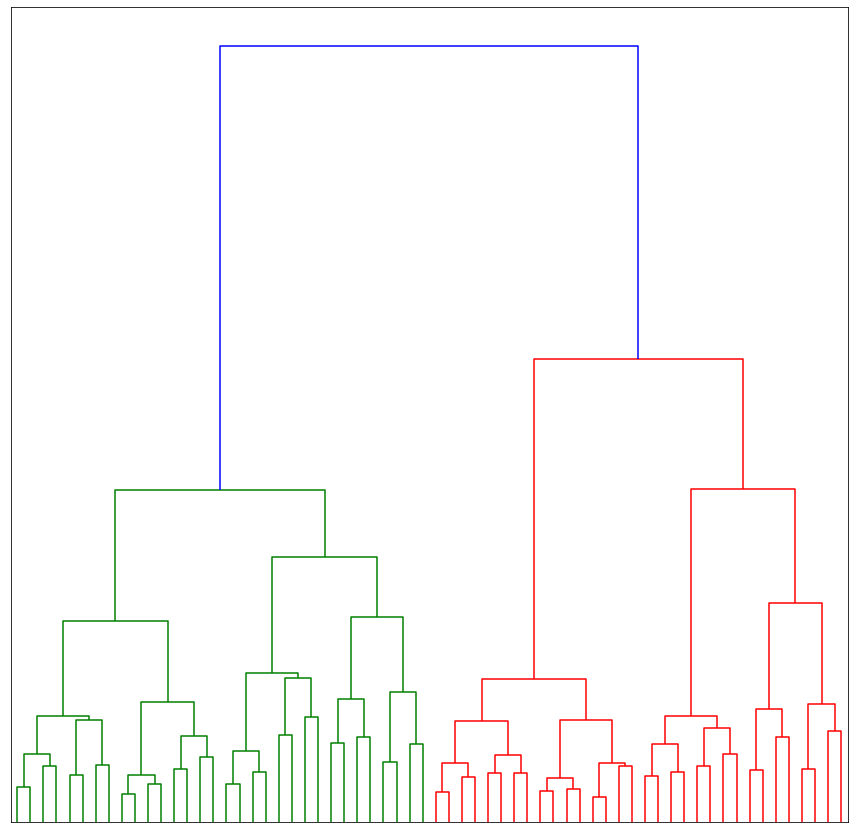

In [ ]:
very_small_training_predictor_table = training_predictor_table.iloc[:1000]

utils.plot_ahc_dendrogram(
    training_predictor_table=very_small_training_predictor_table,
    num_levels_to_show=5
)

# Tuning AHC hyperparameters

 - As for *K*-means, the most important hyperparameter for AHC is the number of clusters ($K$).
 - We will try $K \in \lbrace 1, 2, 3, 4, 5, 10, 15, 20, 25, 30, 50, 100 \rbrace$.

## Training

The next cell performs steps 1 and 2 of the hyperparameter experiment (defining the values to be attempted and training the models).

Training model with 1 clusters...




**************************************************


Training model with 2 clusters...




**************************************************


Training model with 3 clusters...




**************************************************


Training model with 4 clusters...




**************************************************


Training model with 5 clusters...




**************************************************


Training model with 10 clusters...




**************************************************


Training model with 15 clusters...




**************************************************


Training model with 20 clusters...




**************************************************


Training model with 25 clusters...




**************************************************


Training model with 30 clusters...




**************************************************


Training model with 50 clusters...




**********************************************

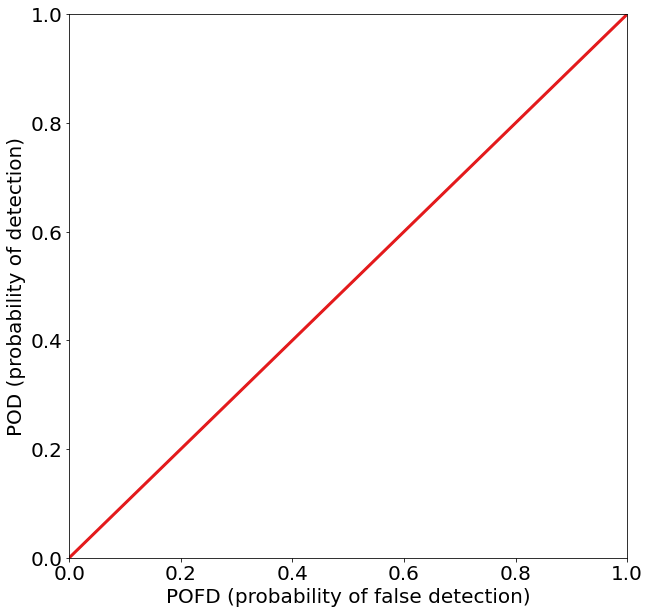

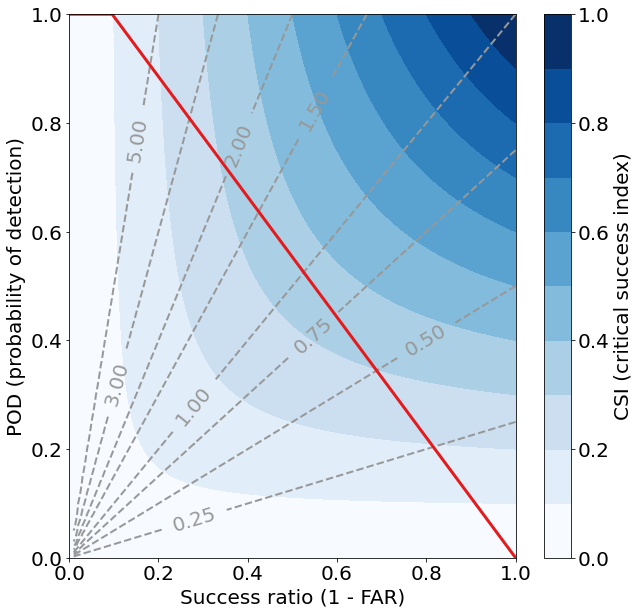

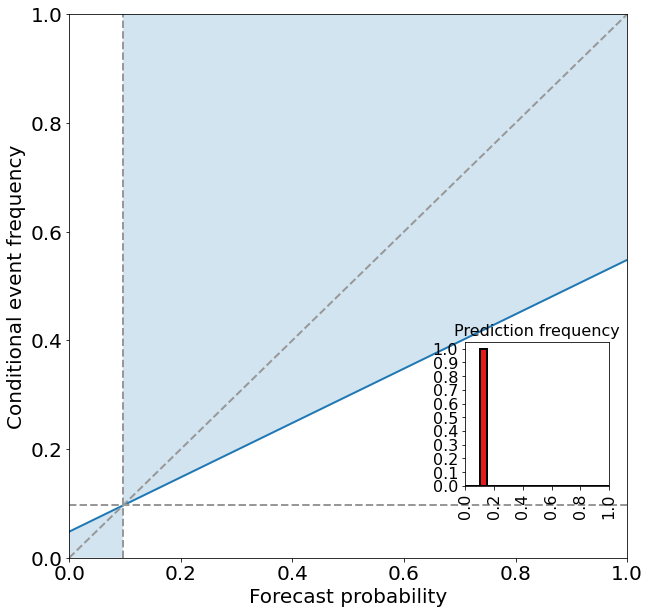

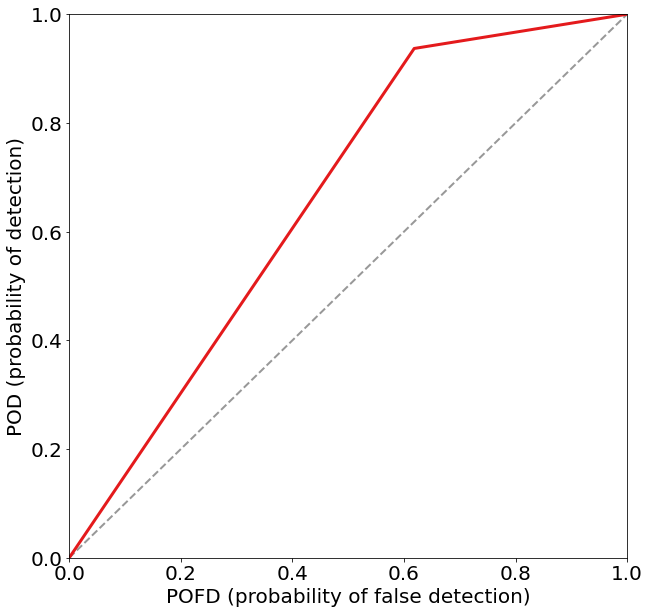

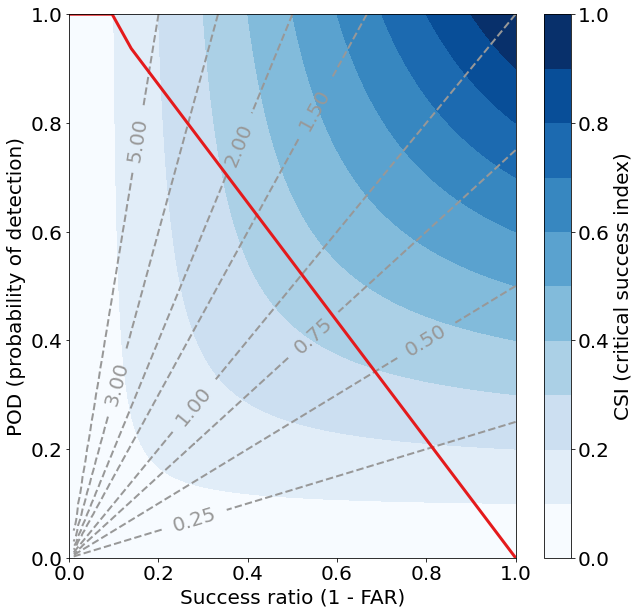

...

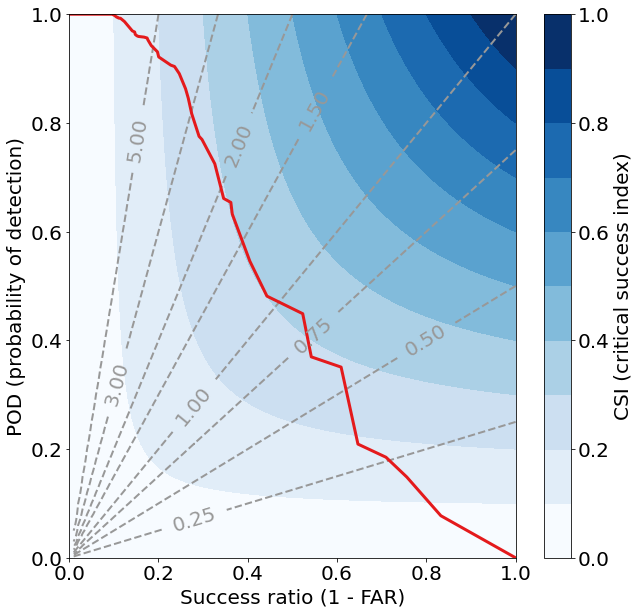

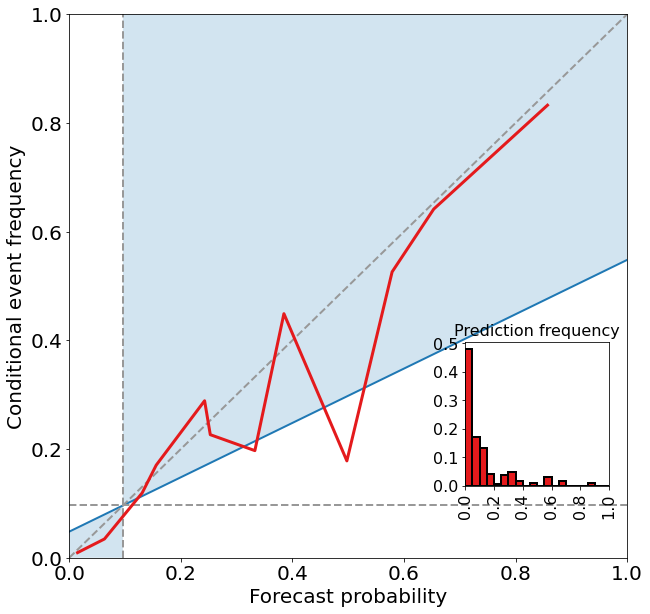

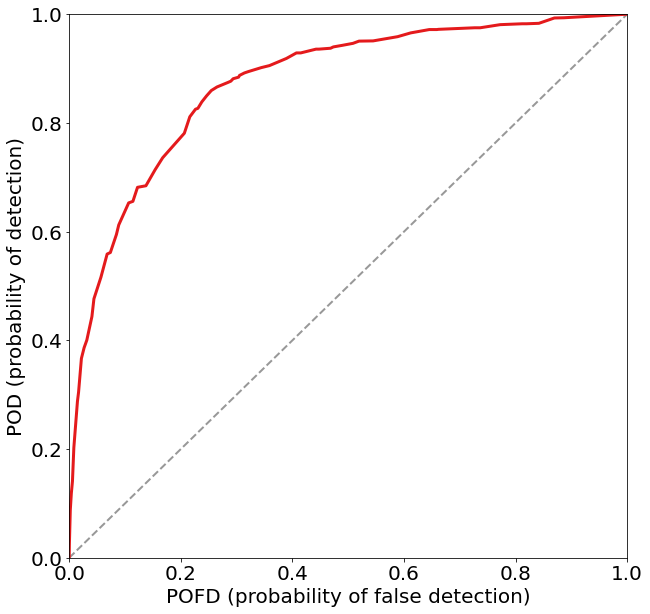

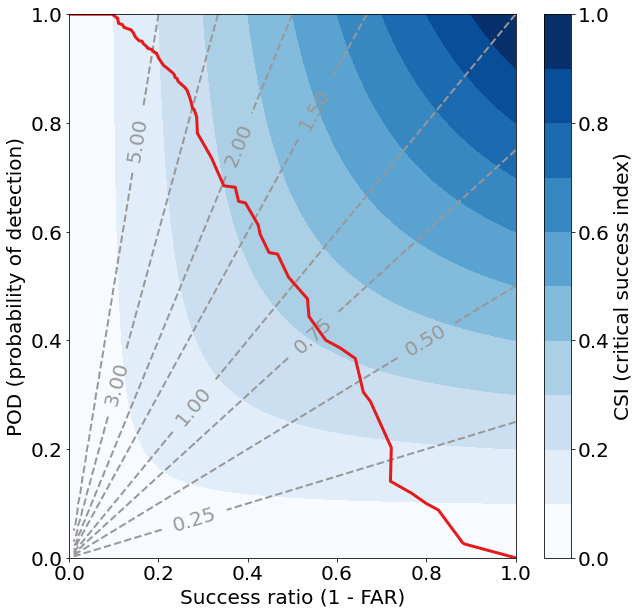

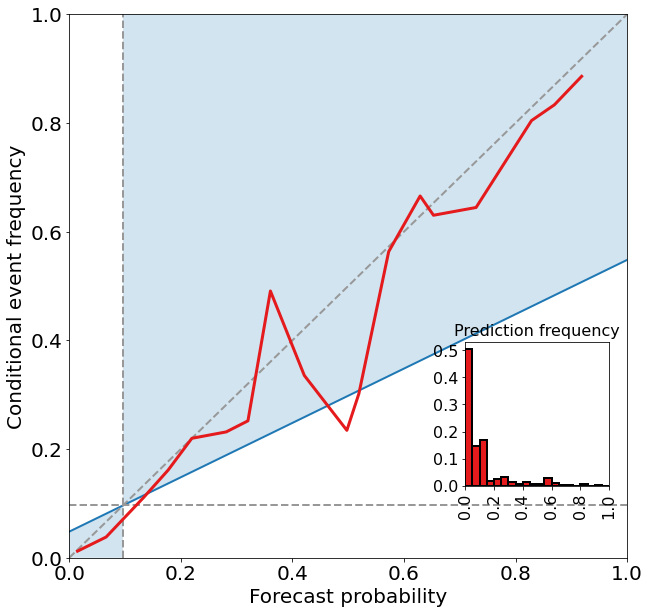

In [ ]:
cluster_counts = numpy.array(
    [1, 2, 3, 4, 5, 10, 15, 20, 25, 30, 50, 100], dtype=int
)
# cluster_counts = numpy.array(
#     [30, 50, 100], dtype=int
# )
num_cluster_counts = len(cluster_counts)

validation_auc_values = numpy.full(num_cluster_counts, numpy.nan)
validation_max_csi_values = validation_auc_values + 0.
validation_bs_values = validation_auc_values + 0.
validation_bss_values = validation_auc_values + 0.

small_training_predictor_table = training_predictor_table.iloc[:25000]
small_training_target_table = training_target_table.iloc[:25000]

training_event_frequency = numpy.mean(
    small_training_target_table[utils.BINARIZED_TARGET_NAME].values
)

for i in range(num_cluster_counts):
    this_message_string = 'Training model with {0:d} clusters...\n\n'.format(
        cluster_counts[i]
    )
    print(this_message_string)

    this_model_object = utils.setup_ahc(num_clusters=cluster_counts[i])

    this_model_object = utils.train_clustering_model(
        model_object=this_model_object,
        training_predictor_table=small_training_predictor_table
    )
    print(SEPARATOR_STRING)

    these_validation_predictions = utils.use_ahc_for_classifn(
        model_object=this_model_object,
        training_predictor_table=small_training_predictor_table,
        training_target_table=small_training_target_table,
        new_predictor_table=validation_predictor_table
    )

    this_evaluation_dict = utils.eval_binary_classifn(
        observed_labels=
        validation_target_table[utils.BINARIZED_TARGET_NAME].values,
        forecast_probabilities=these_validation_predictions,
        training_event_frequency=training_event_frequency,
        create_plots=False, verbose=False
    )

    validation_auc_values[i] = this_evaluation_dict[utils.AUC_KEY]
    validation_max_csi_values[i] = this_evaluation_dict[utils.MAX_CSI_KEY]
    validation_bs_values[i] = this_evaluation_dict[utils.BRIER_SCORE_KEY]
    validation_bss_values[i] = this_evaluation_dict[utils.BRIER_SKILL_SCORE_KEY]

## Validation

The next cell performs step 3 of the hyperparameter experiment (evaluates each model on the validation data).

Text(0.5, 1.0, 'Brier skill score on validation data')

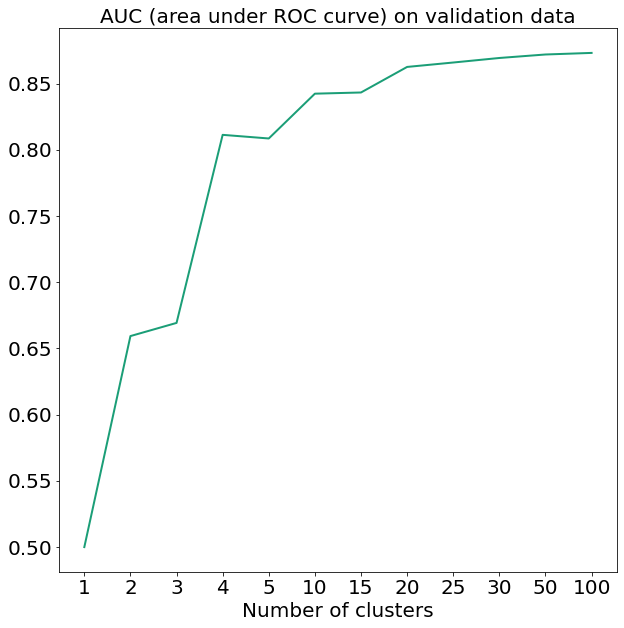

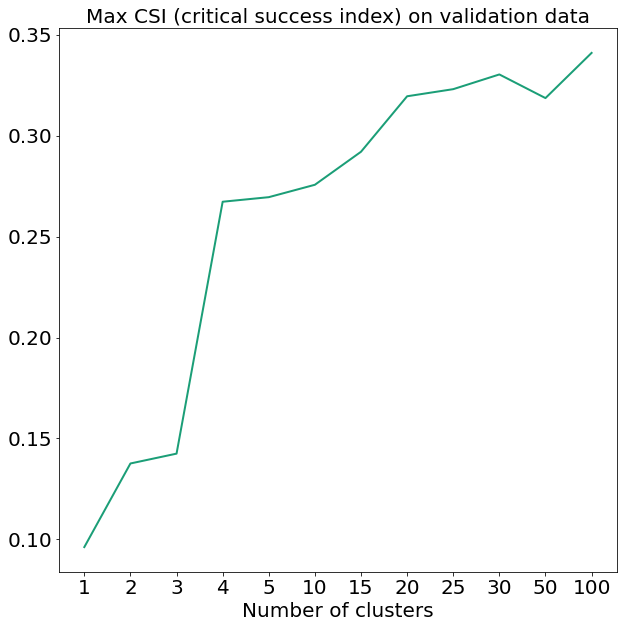

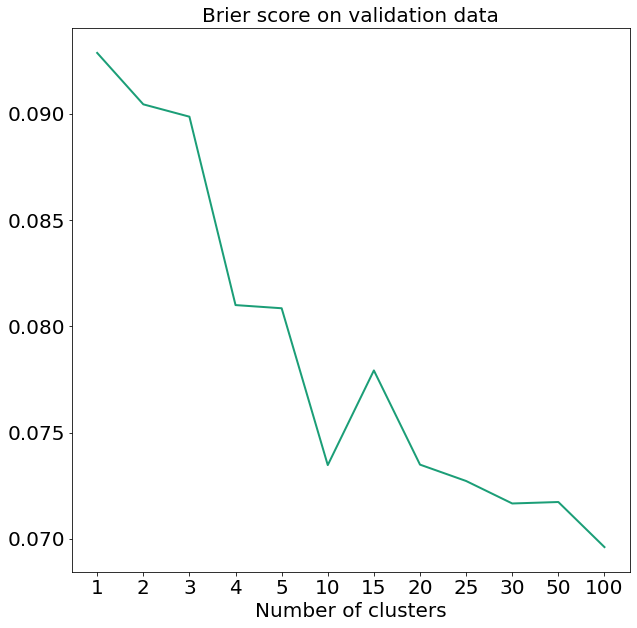

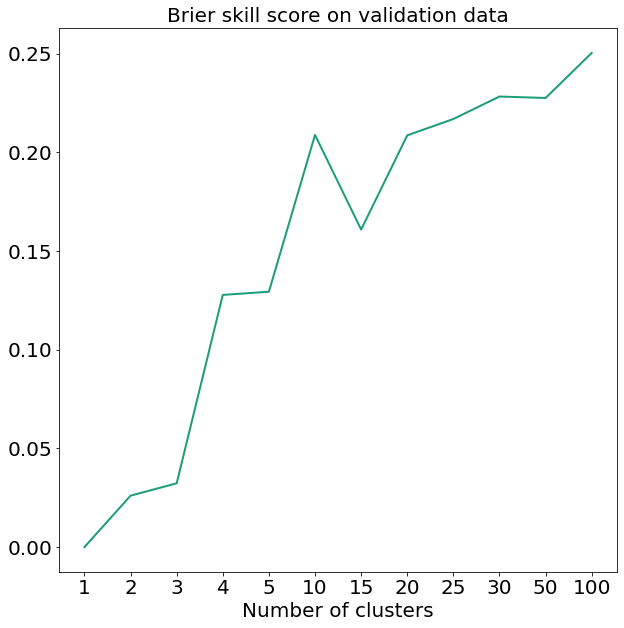

In [ ]:
utils.plot_scores_1d(
    score_values=validation_auc_values, x_tick_labels=cluster_counts
)
pyplot.xlabel('Number of clusters')
pyplot.title('AUC (area under ROC curve) on validation data')

utils.plot_scores_1d(
    score_values=validation_max_csi_values, x_tick_labels=cluster_counts
)
pyplot.xlabel('Number of clusters')
pyplot.title('Max CSI (critical success index) on validation data')

utils.plot_scores_1d(
    score_values=validation_bs_values, x_tick_labels=cluster_counts
)
pyplot.xlabel('Number of clusters')
pyplot.title('Brier score on validation data')

utils.plot_scores_1d(
    score_values=validation_bss_values, x_tick_labels=cluster_counts
)
pyplot.xlabel('Number of clusters')
pyplot.title('Brier skill score on validation data')

## Selection

The next cell performs step 4 of the hyperparameter experiment (select model).



**************************************************




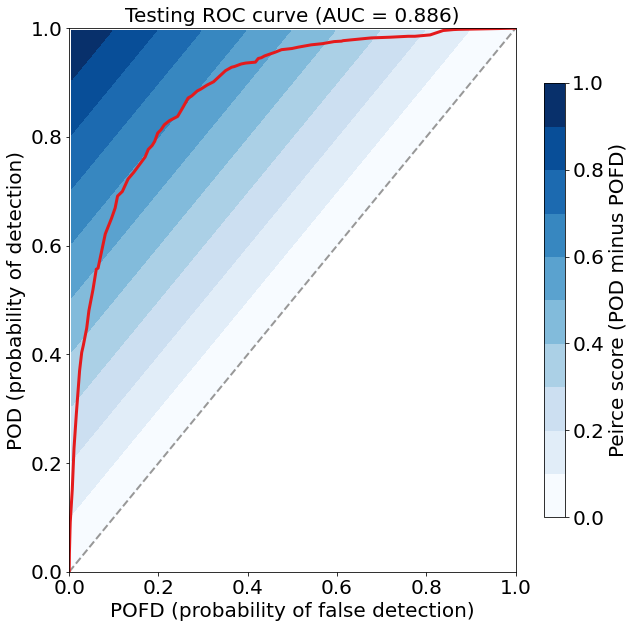

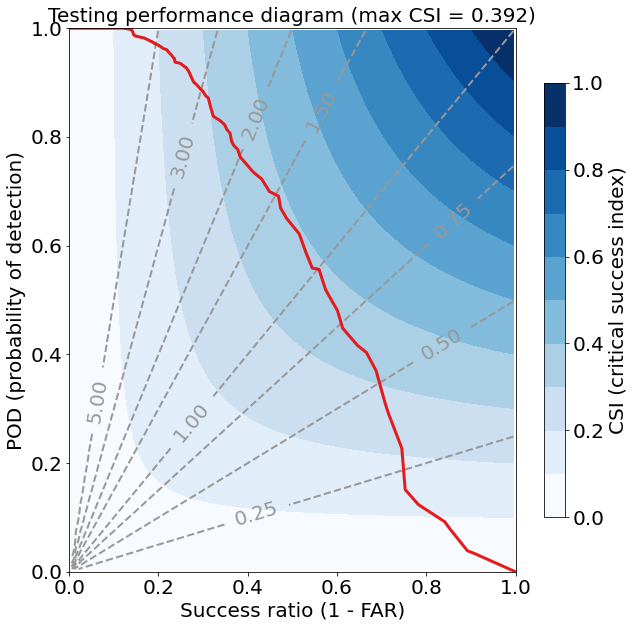

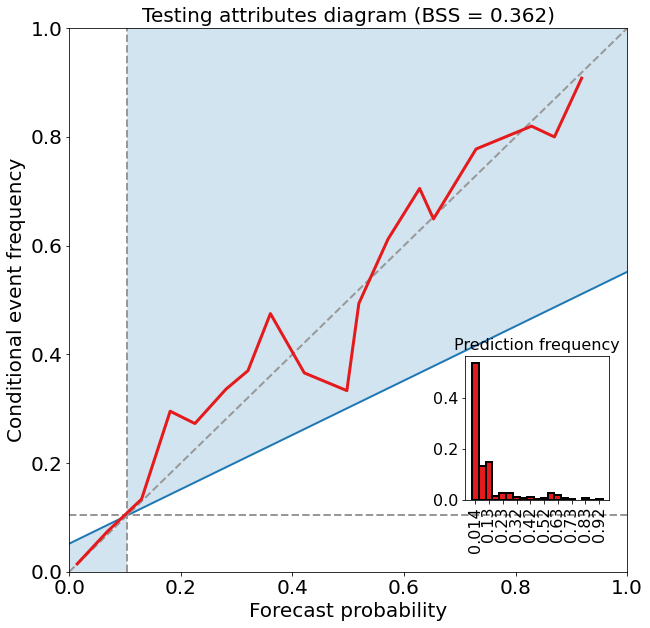

Testing max Peirce score (POD - POFD) = 0.609
Testing AUC (area under ROC curve) = 0.886
Testing max CSI (critical success index) = 0.392
Testing Brier score = 0.059
Testing Brier skill score (improvement over climatology) = 0.362


In [ ]:
best_index = numpy.nanargmax(validation_bss_values)
best_cluster_count = cluster_counts[best_index]
best_validation_bss = numpy.nanmax(validation_bss_values)

message_string = (
    'Best validation BSS = {0:.3f} ... corresponding num clusters = {1:d}'
).format(
    best_validation_bss, best_cluster_count
)

print(message_string)

small_training_predictor_table = training_predictor_table.iloc[:25000]
small_training_target_table = training_target_table.iloc[:25000]

final_model_object = utils.setup_ahc(num_clusters=best_cluster_count)

final_model_object = utils.train_clustering_model(
    model_object=final_model_object,
    training_predictor_table=small_training_predictor_table
)
print(SEPARATOR_STRING)

testing_predictions = utils.use_ahc_for_classifn(
    model_object=final_model_object,
    training_predictor_table=small_training_predictor_table,
    training_target_table=small_training_target_table,
    new_predictor_table=testing_predictor_table
)

training_event_frequency = numpy.mean(
    small_training_target_table[utils.BINARIZED_TARGET_NAME].values
)

_ = utils.eval_binary_classifn(
    observed_labels=
    testing_target_table[utils.BINARIZED_TARGET_NAME].values,
    forecast_probabilities=testing_predictions,
    training_event_frequency=training_event_frequency,
    create_plots=True, verbose=True,
    dataset_name='testing'
)